In [1]:
import svg
import svg.path
from svg.path import parse_path
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import xml
from xml.dom import minidom
%load_ext autoreload
%autoreload 2

In [2]:
import scipy.stats

In [3]:
def polyline2path(coord):
    
    #Transform one or more polylines svg into svg paths#
    
    for i in range(len(coord)):
        ipath=coord[i]
        ipath ="M"+ipath
        c=0
        for ichar in range(len(ipath)):
            char=ipath[ichar]
            if char == " ":
                c+=1
            if c==2:
                ipath=ipath[:ichar]+"L"+ipath[ichar:]
                break

        coord[i]=ipath

    return coord


def path2coord(path, smpl=0.001):
    
    #from svg path to coordinates#
    
    l=[]
    
    for i in np.arange(0, 1, smpl):
        l.append((path.point(i).real, -path.point(i).imag))
    
    return np.array(l)

In [4]:
doc_p = "E-W_Bumberg_only_lines.svg"
doc = minidom.parse(doc_p)
box=doc.getElementsByTagName('svg')[0].getAttribute("viewBox").split(" ")
ox,oy,x1,y1 = [float(i) for i in box]  # get bound box
ox, oy, x1, y1

(0.0, 0.0, 2464.89, 376.36)

In [5]:
# x1 = 2365
# y1 = 303

In [6]:
for child in doc.childNodes[0].childNodes:
    flag = False
    try:
        ids = child.getAttribute("id")
        print(ids)
        if ids == "Rank_7":
            paths = [path.getAttribute('d') for path in child.getElementsByTagName('path')]
            polylines =  [path.getAttribute('points') for path in child.getElementsByTagName('polyline')]
            path_polylines = polyline2path(polylines)
            break
    except:
        pass
            


Calque_1
Rank_4
Rank_5
Rank_7


In [7]:
# plt.figure(figsize=(15, 5), dpi=300)
x_length = 117
y_length = 12.5

dic_surfs = {}
for child in doc.childNodes[0].childNodes:
    flag = False
    try:
        ids = child.getAttribute("id")
        print(ids)
        if ids[:4] == "Rank" or ids == "Top":
            flag = True
    except:
        pass
    
    if flag:
        paths = [path.getAttribute('d') for path in child.getElementsByTagName('path')]
        transforms = [path.getAttribute('transform') for path in child.getElementsByTagName('path')]
        polylines =  [path.getAttribute('points') for path in child.getElementsByTagName('polyline')]
        path_polylines = polyline2path(polylines)

        new_l=[]
        for i_a, transf in zip(paths, transforms):
            
            coord = path2coord(parse_path(i_a), smpl=0.01)
            
            if len(transf) > 0:
            
                x_t, y_t = transf.split("(")[-1].split(")")[0].split()
                x_t = float(x_t)
                y_t = float(y_t)

                coord[:, 0] -= x_t
                coord[:, 1] -= y_t

            new_l.append(coord)
            
        for i_a in path_polylines:
            new_l.append(path2coord(parse_path(i_a), smpl=0.01))
        
        
        dic_surfs[ids] = new_l
    
    
xmax = x1
ymax = y1

for k,v in dic_surfs.items():

    x1 = max(np.array(v).reshape(-1, 2)[:, 0])
    y1 = min(np.array(v).reshape(-1, 2)[:, 1])

    if x1 > xmax:
        xmax = x1

    if y1 < ymax:
        ymax = y1

ymax = -ymax

for k, new_l in dic_surfs.items():

    #change coordinates in meters
    fac_x=xmax/x_length
    min_y=ymax
    for line in new_l:
        line[:, 0]/=fac_x
        line[:, 1]+=min_y

    fac_y=ymax/y_length
    for line in new_l:
        line[:, 1]/=fac_y


Calque_1
Rank_4
Rank_5
Rank_7
Rank_3
Top


In [8]:
d_color = {"Rank_3" : "darkorange",
           "Rank_4" : "fuchsia",
           "Rank_5" : "blue",
           "Rank_7" : "red",
           "Top"    : "black"}

(-3.0018603264243033,
 117.75858780716382,
 -0.5870072031201743,
 12.32715126552366)

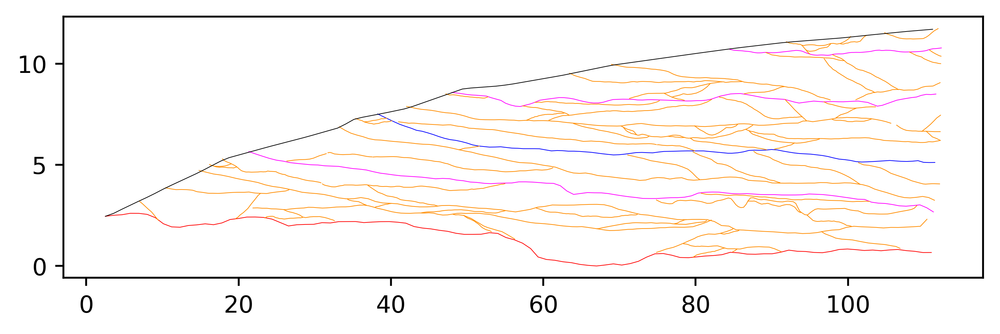

In [9]:
plt.figure(figsize=(7, 2), dpi=500)

for k,v in dic_surfs.items():
    
    for test in v:
        plt.plot(test[:, 0], test[:, 1], linewidth=.3, c=d_color[k])
    
plt.axis("auto")

### estimate variogram exp

In [10]:
import geone

In [11]:
cm_test = geone.covModel.CovModel1D(elem=[("spherical", {"w":np.nan, "r":np.nan}),
                                          ("cubic", {"w":np.nan, "r":np.nan}),
                                          ("exponential", {"w":np.nan, "r":np.nan})])

# cm_test = geone.covModel.CovModel1D(elem=[("matern", {"w":np.nan, "r":np.nan, "nu":np.nan})])

(array([ 0.66098273,  2.15235667,  3.68872545,  5.19134593,  6.69725128,
         8.19262789,  9.70120186, 11.22029446, 12.72431351, 14.20237671,
        15.71449648, 17.21288435, 18.74516655, 20.25529162, 21.72957251,
        23.23107462, 24.72130076, 26.23198125, 27.73429329, 29.26179811]),
 array([0.00779307, 0.03503901, 0.04822552, 0.08655834, 0.11584567,
        0.12215519, 0.11340346, 0.10112415, 0.1050163 , 0.10136398,
        0.12800487, 0.16174597, 0.20082778, 0.24178301, 0.27232288,
        0.31421914, 0.35855757, 0.37225978, 0.38065445, 0.34649086]),
 array([185503,  84337,  45729,  27707,  18442,  12766,   8232,   5710,
          4257,   3159,   2596,   1953,   1864,   1290,   1207,    947,
           854,    773,    712,    592]))

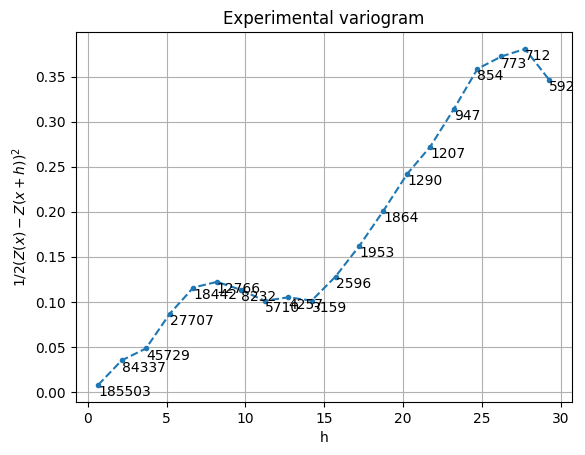

In [12]:
# compute variogram clouds of each surface and aggregate them
hmax = 30
rmax = 500
var = 1

# retrieve all pairs of points
all_h = np.array([])
all_v = np.array([])


for iv in dic_surfs["Rank_3"][:]:

    h,v, n_p = geone.covModel.variogramCloud1D(iv[:, 0], iv[:, 1], make_plot=False)

    # keep pair of points above hmax
    v = v[h<hmax]
    h = h[h<hmax]

    all_h = np.concatenate((all_h, h))
    all_v = np.concatenate((all_v, v))

var_cloud = (all_h, all_v, n_p)

# compute the global variogram experimental
geone.covModel.variogramExp1D(x=None, v=None, variogramCloud=var_cloud, make_plot=True, ncla=20)

# cm_opt, popt = geone.covModel.covModel1D_fit(x=None, v=None, variogramCloud=var_cloud, cov_model = cm_test, bounds=((0, 0, 0, 0, 0, 0), 
#                                        (var, rmax, var, rmax, var, rmax)), make_plot=True)


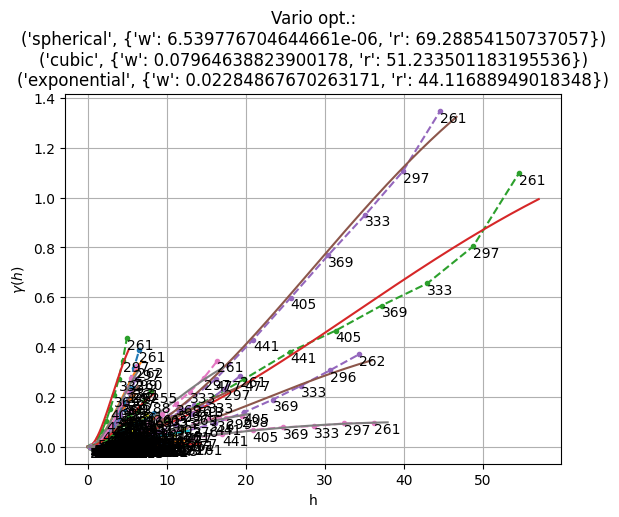

In [13]:

x = []
val = []

h_l = []
v_l = []
p_l = []

cm_l = []
popt = []
plot = True

means = []
for iv in dic_surfs["Rank_3"][:]:
    
    xmax = np.max(iv[:, 0])
    xmin = np.min(iv[:, 0])
    hmax = 0.6* (xmax - xmin)
    
    mean = np.mean(iv[:, 1])
    
    if hmax > 5:
        
        means.append(mean)
        
        h,v,p = geone.covModel.variogramExp1D(iv[:, 0], iv[:, 1], make_plot=plot, hmax=hmax)
        
        var = 3
        if not np.isnan(h).any():
            try:
#                 cm_opt = geone.covModel.covModel1D_fit(iv[:, 0], iv[:, 1], cm_test, bounds=((0, 0, 0), 
#                                                                             (var, 2*hmax, 5)),
#                                     p0=(1, 10, 1), hmax=hmax, make_plot=plot)
                cm_opt = geone.covModel.covModel1D_fit(iv[:, 0], iv[:, 1], cm_test, bounds=((0, 0, 0, 0, 0, 0), 
                                                                                            (var, 2*hmax, var, 2*hmax, var, 2*hmax)),
                                                    p0=(1, 10, 1, 10, 1, 10), hmax=hmax, make_plot=plot)
            except:
                cm_opt = None

            if cm_opt is not None:

                cm = cm_opt[0]
                for elem in cm.elem:
                    if elem[1]["w"] < 0.1:
                        cm.elem.remove(elem)
                
                if len(cm.elem) > 0:
                    cm_l.append(cm)
                    popt.append(cm_opt[1])
                    
                    h_l.append(h)
                    v_l.append(v)
                    p_l.append(p)


In [14]:
Cp = (np.cov(np.array(popt).T))
mu = np.mean(popt, axis=0)

In [15]:
np.random.multivariate_normal(mu, Cp)

array([ 1.18107342e-01,  4.33352043e+01, -7.81107868e-02,  2.33339905e+01,
        6.75419635e-03,  2.80862800e+01])

In [16]:
popt = np.array(popt)

In [17]:
# simple mean
mean_popt = popt.mean(0)

# weighted (by length) mean

weights = np.array(h_l)[:, -1] - np.array(h_l)[:, 0]
mean_popt = (weights.reshape(-1, 1) * popt).sum(0) / weights.sum()

In [18]:
cm_mean_popt = geone.covModel.CovModel1D(elem=[("spherical", {"w":mean_popt[0], "r":mean_popt[1]}),
                                         ("cubic", {"w":mean_popt[2], "r":mean_popt[3]}),
                                         ("exponential", {"w":mean_popt[4], "r":mean_popt[5]})])

# cm_mean_popt = geone.covModel.CovModel1D(elem=[("matern", {"w":mean_popt[0], "r":mean_popt[1], "nu":mean_popt[2]})])


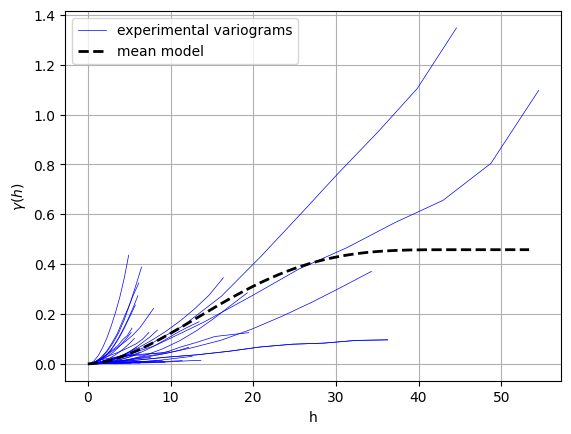

In [19]:
for h, v in zip(h_l, v_l):
    plt.plot(h, v, c="blue", linewidth=.5)
plt.plot(h, v, c="blue", linewidth=.5, label="experimental variograms")    

# cm_r3_manual1 = geone.covModel.CovModel1D(elem=[("cubic", {"w":.5, "r":55})])
# cm_r3_manual1.plot_model(1, c="k", linewidth=2, label="manual")

# cm_r3_manual2 = geone.covModel.CovModel1D(elem=[("cubic", {"w":.5, "r":25})])
# cm_r3_manual2.plot_model(1, c="k", linewidth=2, label="manual")

cm_mean_popt.plot_model(1, c="k", linewidth=2, linestyle="--", label="mean model")
plt.legend()

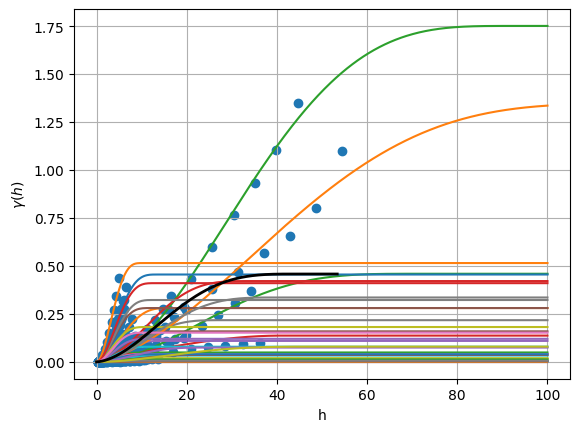

In [20]:
for cm in cm_l:
    cm.plot_model(1, hmax=100)
    
plt.scatter(h_l, v_l)
cm_mean_popt.plot_model(1, c="k", linewidth=2)

# cm_r3_manual1.plot_model(1, c="k", linewidth=2, label="manual")
# cm_r3_manual2.plot_model(1, c="k", linewidth=2, label="manual")

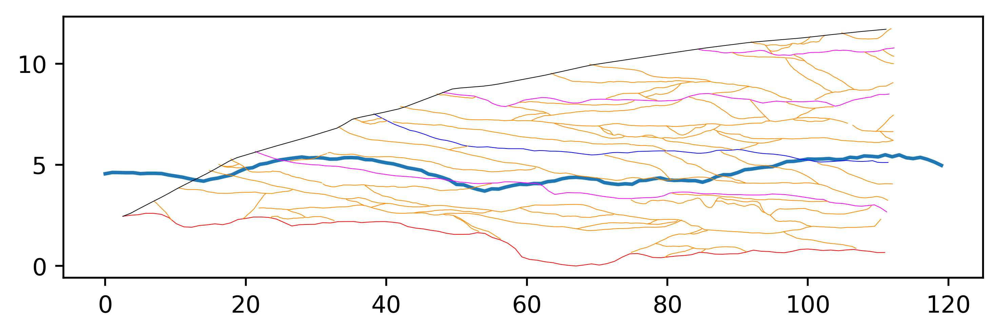

In [21]:
plt.figure(figsize=(7, 2), dpi=500)

cm = np.random.choice(cm_l)
sim = geone.multiGaussian.multiGaussianRun(cm_mean_popt, 120, 1, output_mode="array", mean=5)
plt.plot(sim[0])

# sim = geone.multiGaussian.multiGaussianRun(cm_r3_manual1, 150, 1, output_mode="array", mean=2)
# plt.plot(sim[0])

for k,v in dic_surfs.items():
    
    for test in v:
        plt.plot(test[:, 0], test[:, 1], linewidth=.3, c=d_color[k])
# plt.plot((ox, x_length), (y_length, y_length), linewidth=.3)


### Covmodels rank 5-7

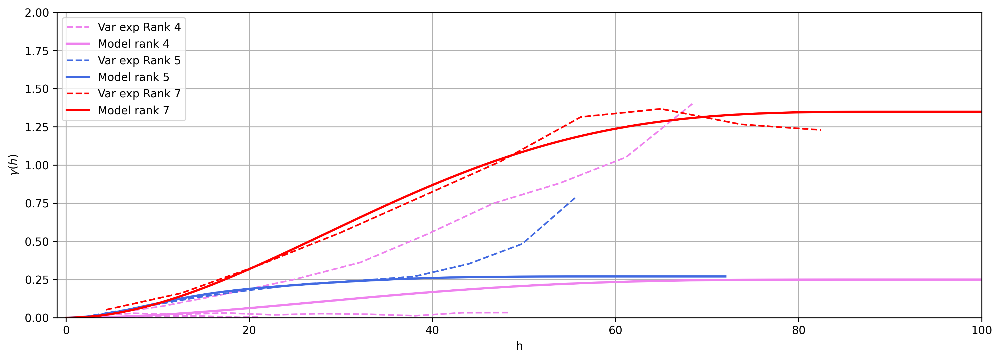

In [22]:
fig = plt.figure(figsize=(15, 5), dpi=300)
x = []
val = []

i = 0
for iv in dic_surfs["Rank_4"]:
    
    hmax = 0.8 * np.abs(iv[-1, 0] - iv[0, 0])
    h, v, pt = geone.covModel.variogramExp1D(iv[:, 0], iv[:, 1], hmax= hmax, make_plot=False)
    
    if i == 0:
        plt.plot(h, v, linestyle="--", label="Var exp Rank 4", c="violet")
    else:
        plt.plot(h, v, linestyle="--", c="violet")
    i += 1
    
    cm_r4 = geone.covModel.CovModel1D(elem = [("cubic", {"w":0.25, "r":90})])
    
cm_r4.plot_model(1, c = "violet", linewidth="2", label="Model rank 4")


for iv in dic_surfs["Rank_5"]:
    
    hmax = 0.8 * np.abs(iv[-1, 0] - iv[0, 0])
    h, v, pt = geone.covModel.variogramExp1D(iv[:, 0], iv[:, 1], hmax=hmax, make_plot=False)
    plt.plot(h, v, linestyle="--", label="Var exp Rank 5", c="royalblue")
    cm_r5 = geone.covModel.CovModel1D(elem = [("cubic", {"w":0.12, "r":25}),
                                              ("cubic", {"w":0.15, "r":60})])
    
cm_r5.plot_model(1, c = "royalblue", linewidth="2", label="Model rank 5")
    
for iv in dic_surfs["Rank_7"]:
    
    hmax = 0.8 * np.abs(iv[-1, 0] - iv[0, 0])
    h, v, pt = geone.covModel.variogramExp1D(iv[:, 0], iv[:, 1], hmax=hmax, make_plot=False)
    plt.plot(h, v, linestyle="--", label="Var exp Rank 7", c="red")
    cm_r7 = geone.covModel.CovModel1D(elem = [("cubic", {"w":np.nan, "r":np.nan})])
    # fit
    cm_r7 = geone.covModel.covModel1D_fit(iv[:, 0], iv[:, 1], cm_r7, bounds=((0, 0),
                                                                            (3, 100))
                                            , hmax=hmax, make_plot=False)[0]
    # cm_r7 = geone.covModel.CovModel1D(elem = [("cubic", {"w":0.8, "r":110}),
    #                                           ("cubic", {"w":0.5, "r":70}),
    #                                           ("cubic", {"w":0.15, "r":20}),
    #                                           ("spherical", {"w":0, "r":100})])
    
cm_r7.plot_model(1, c = "red", linewidth="2", label="Model rank 7")


# # rank 3
# i = 0
# for h, v in zip(h_l, v_l):
    
#     if i == 0:
#         plt.plot(h, v, c="goldenrod", linestyle="--", label = "Var exp Rank 3", alpha = .5)
#     else:
#         plt.plot(h, v, c="goldenrod", linestyle="--", alpha = .5)
#     i += 1
# cm_r3_manual1.plot_model(1, c="goldenrod", linewidth=2, label="Model rank 3 - 1")
# cm_r3_manual2.plot_model(1, c="goldenrod", linewidth=2, label="Model rank 3 - 2")
# cm_mean_popt.plot_model(1, c="chocolate", linewidth=2, label="Model rank 3 (mean popt)")

plt.xlim(-1, 100)
plt.ylim(0, 2)
a = plt.legend()

In [23]:
cm_r7

*** CovModel1D object ***
name = 'cov1D-cubic'
number of elementary contribution(s): 1
elementary contribution 0
    type: cubic
    parameters:
        w = 1.3487322274119633
        r = 93.54141972361006
*****

### Colors, probas, facies ids

In [24]:
d_colors = {510:([0.8, 0.2, 0.6, 1. ],),
 14: ([0.2, 0.4, 0. , 1. ]),
 744: ([1. , 0.4, 0. , 1. ]),
 230: ([0.4, 0.6, 1. , 1. ]),
 366: ([0.6, 0.2, 0. , 1. ]),
 68: ([0.2, 0.6, 0. , 1. ]),
 843: ([1. , 0.8, 0.2, 1. ])}

In [25]:
im =  geone.img.readImage2Drgb("E-W_Bumberg.png", categ=True)

In [26]:
d_replace = {744: 843, 510:843, 14:68}
for k, v in d_replace.items():
    im[0].val[im[0].val == k] = v

In [27]:
bn_counts = np.bincount(im[0].val.flatten().astype(int))
idx = np.arange(len(bn_counts))

d = {}
for bn, id in zip(bn_counts, idx):
    d[id] = bn
    
n_d = {k: v for k, v in sorted(d.items(), key=lambda item: item[1])}

c_idx = list(n_d.keys())[-5:-1]
d = {k: v for k, v in n_d.items() if k in c_idx}  # keep real facies

facies_ids = list(d.keys())

colors = {v: im[1][v] for v in c_idx}

# proportions
tot_sum = sum(d.values())
probas = []
for k, v in d.items():
    probas.append(v / tot_sum)

In [28]:
im[0].set_spacing(117/im[0].nx, 11.8/im[0].ny, 1)

In [29]:
# replace values in image that are not in facies_ids by nan
im[0].val[~np.isin(im[0].val, facies_ids)] = np.nan

In [30]:
import copy
im_ref = copy.deepcopy(im)

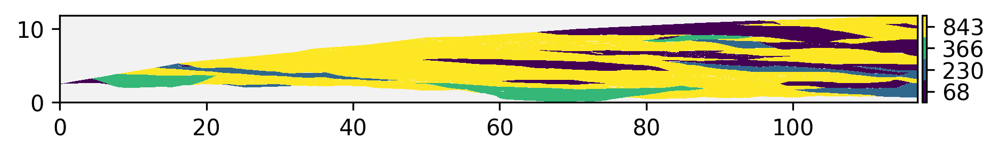

In [31]:
plt.figure(figsize=(7, 2), dpi=300)
geone.imgplot.drawImage2D(im[0], categ=True, origin="lower")

In [32]:
np.random.seed(0)

# extract some boreholes from the image
bhs = []
n_bhs = 4
for i in range(n_bhs):
    
    if i == 3:
        ix = 9000
    else:
        ix = np.random.randint(0, im[0].nx)
    # get facies log
    fa_bef = None
    log = []
    for iy in range(im[0].ny-1, 0, -1):
        fa = im[0].val[0, 0, iy, ix]
        if ~np.isnan(fa):
            if fa != fa_bef:
                y = im[0].ymin() + iy * im[0].sy
                y = np.round(y, 2)
                log.append((int(fa), y))
                fa_bef = fa

    x = im[0].xmin() + ix * im[0].sx
    x = np.round(x, 2)
    print(x)
    depth = log[0][1]
    bhs.append((x, depth, log))

33.3
39.79
59.23
109.71


In [33]:
im[0]

*** Img object ***
name = ''
(nx, ny, nz) = (9598, 1184, 1) # number of cells along each axis
(sx, sy, sz) = (0.01219003959158158, 0.009966216216216217, 1.0) # cell size (spacing) along each axis
(ox, oy, oz) = (0.0, 0.0, 0.0) # origin (coordinates of bottom-lower-left corner)
nv = 1  # number of variable(s)
varname = ['code']
val: (1, 1, 1184, 9598)-array
*****

(0.0, 117.0)

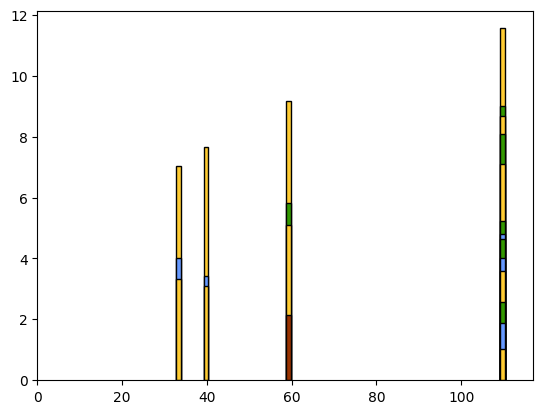

In [34]:
def plot_bh(w_logs, width=1, colors=None, ax=None):
    
    if ax is None:
        fig = plt.figure()
        ax = plt.gca()

    for s in w_logs:
        
        x,y, log = s
        z_0 = log[0][1] - y
        for unit in log:
            c = colors[unit[0]]
            ax.bar(x, unit[1] - z_0, bottom=z_0, linewidth=width, edgecolor="black", color=c, width=width)

plot_bh(bhs[:], colors=colors)
plt.xlim(0, 117)

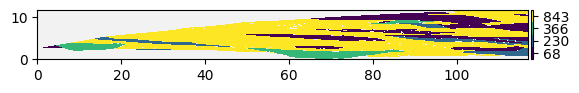

In [35]:
# Make the image coarser
nx_new_2 = int(im[0].nx/2)
ny_new_2 = int(im[0].ny/2)
im_new_2 = geone.img.interpolateImage(im[0], nx=nx_new_2, ny=ny_new_2, categVar=[True])

geone.imgplot.drawImage2D(im_new_2, categ=True, origin="lower")

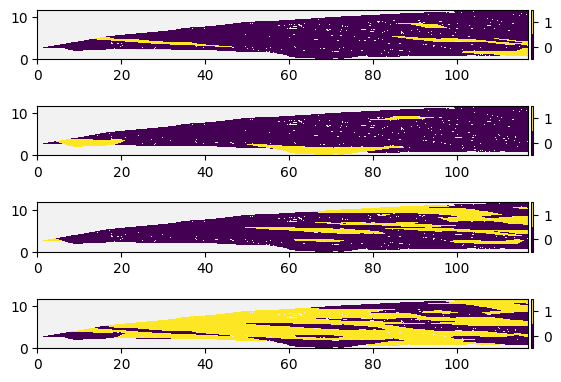

In [36]:
# create a binary image for each facies
im_bin = []
for i in range(len(facies_ids)):
    val = (im_new_2.val==facies_ids[i]).astype(float)
    # set nan where there is nan in the image
    val[im_new_2.val != im_new_2.val] = np.nan
    im_bin.append(geone.img.Img(nx=im_new_2.nx, ny=im_new_2.ny, nz=1, nv=1, val=val,
                                sx = im_new_2.sx, sy=im_new_2.sy, sz=im_new_2.sz,
                                ox=im_new_2.ox, oy=im_new_2.oy, oz=im_new_2.oz,
                                name="facies_"+str(facies_ids[i])))
    
# plot
    
# plots
o = 1
for im_i in im_bin:
    plt.subplot(4, 1, o)
    geone.imgplot.drawImage2D(im_i, categ=True, origin="lower")
    o += 1

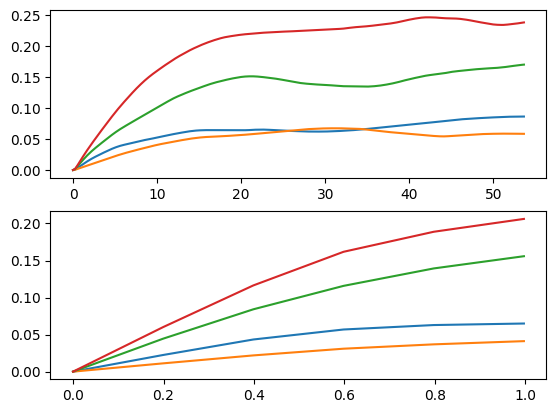

In [37]:
o = 0
varios_hor = []
varios_ver = []

for im_i in im_bin[:]:
    im_bin_1_cov = geone.geosclassicinterface.imgTwoPointStatisticsImage(im_i, 0, hx_min=-2200, hx_max=2200, hy_min=-50, hy_max=50, hx_step=10, hy_step=10, stat_type="variogram")
    x = im_bin_1_cov.sx * np.arange(int(im_bin_1_cov.nx/2 + 1))
    y = im_bin_1_cov.sy * np.arange(int(im_bin_1_cov.ny/2 + 1))
    varios_hor.append((x, im_bin_1_cov.val[0, 0, int(im_bin_1_cov.ny/2), int(im_bin_1_cov.nx/2):]))
    varios_ver.append((y, im_bin_1_cov.val[0, 0, int(im_bin_1_cov.ny/2):, int(im_bin_1_cov.nx/2)]))
    
    plt.subplot(2, 1, 1)
    plt.plot(x, im_bin_1_cov.val[0, 0, int(im_bin_1_cov.ny/2), int(im_bin_1_cov.nx/2):])

    plt.subplot(2, 1, 2)
    plt.plot(y, im_bin_1_cov.val[0, 0, int(im_bin_1_cov.ny/2):, int(im_bin_1_cov.nx/2)])

    var_fa = probas[o] * (1 - probas[o]) 
    # plt.scatter((0, max(x)), (var_fa, var_fa), c="k", alpha=0.3)
    o += 1

# plt.xlim(0, 20)

In [38]:
colors

{230: array([0.4, 0.6, 1. , 1. ], dtype=float32),
 366: array([0.6, 0.2, 0. , 1. ], dtype=float32),
 68: array([0.2, 0.6, 0. , 1. ], dtype=float32),
 843: array([1. , 0.8, 0.2, 1. ], dtype=float32)}

In [39]:
probas

[0.07183233164530575,
 0.08669420336265068,
 0.20846051043252076,
 0.6330129545595228]

In [40]:
facies_ids

[230, 366, 68, 843]

(-1.0, 1.0)

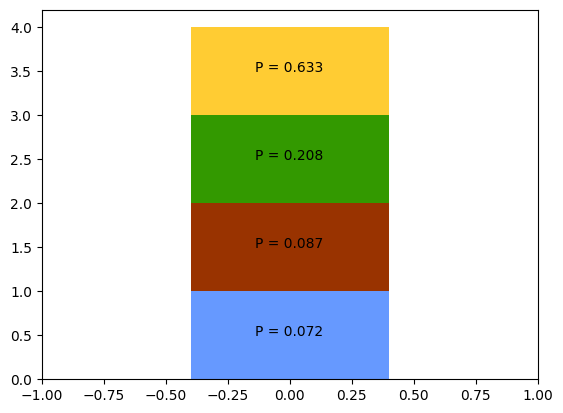

In [41]:
for i in range(len(colors)):
    color = list(colors.values())[i]
    plt.bar(0, 1, bottom=i, color=color)
    plt.text(-0.14, i+0.5, "P = " + str(np.round(probas[i], 3)))
plt.xlim(-1, 1)

In [42]:
import sys

sys.path.append("../../")

In [43]:
import EROS

In [44]:
#number of surf
N = 100

# grid
oz = 0
z1 = 12.5
ox = 0
x1 = 117
nx = 300
nz = 200
sx = x1 / nx
sz = z1 / nz
xg = np.linspace(0, x1, nx)
zg = np.linspace(0, z1, nz)

means = np.sort(np.random.uniform(0, 15, size=N))

# bot 
x_bot, z_bot = dic_surfs["Rank_7"][0].T
bot = np.interp(xg, x_bot, z_bot)

# top 
x_top, z_top = dic_surfs["Top"][0].T
top = np.interp(xg, x_top, z_top)

In [45]:
# covmodels = np.random.choice([cm_r3_manual1, cm_r3_manual2, cm_mean_popt], size=N, p = (0.2, 0.2, 0.6))

In [46]:
real_surf, arr_res, list_p_cond = EROS.sim_uncond_2D(N, cm_mean_popt, means, (nx, nz), (sx, sz), (0, 0),
                                                     bot = bot, top = top, xi = 0.2, facies_ids=facies_ids, proba=probas,
                                                     alpha=.8, seed=None, grf_method="sgs")

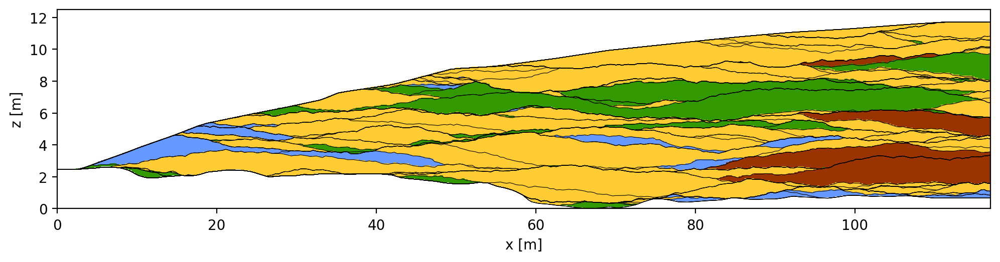

In [47]:
arr_plot = np.zeros([nz, nx, 3])
o = 0
for ival in np.unique(arr_res):
    if ival == -99:
        arr_plot[arr_res==-99] = (1, 1, 1)
#     else:
#         np.random.seed(ival+24)
#         arr_plot[arr_res==ival] = np.random.random(size=3)
    else:
        arr_plot[arr_res==ival] = colors[ival][:3]
    
fig, axs = plt.subplots(figsize=(12,5), dpi=200)
plt.imshow(arr_plot, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)
plt.plot(xg, real_surf.T, c="k", linewidth=.4)
plt.xlabel("x [m]")
plt.ylabel("z [m]")

plt.show()

#### Reference

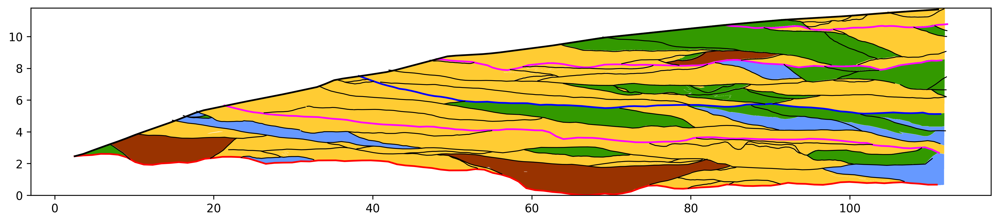

In [48]:
plt.figure(figsize=(15, 5), dpi=300)
arr_color = plt.imread("E-W_Bumberg.png")

arr_plot_ref = np.ones(arr_color.shape)
# keep colors
for c in colors.values():
    arr_plot_ref[(arr_color==c).all(2), :] = c

arr_plot_ref[(arr_color==np.array([0.2, 0.4, 0. , 1. ], dtype=np.float32)).all(2), :] = [0.2, 0.6, 0. , 1. ]
arr_plot_ref[(arr_color==np.array([1. , 0.4, 0. , 1. ], dtype=np.float32)).all(2), :] = [1. , 0.8, 0.2, 1. ]
arr_plot_ref[(arr_color==np.array([0.8, 0.2, 0.6, 1. ], dtype=np.float32)).all(2), :] = [1. , 0.8, 0.2, 1. ]

plt.imshow(arr_plot_ref, extent=[ox+3, x1-5, oz, z1-.7], aspect=2)

for k,v in dic_surfs.items():
    if k == "Rank_3":
        for test in v:
            plt.plot(test[:, 0], test[:, 1], linewidth=.8, c="k")
    else:
        for test in v:
            plt.plot(test[:, 0], test[:, 1], linewidth=1.5, c=d_color[k])

In [49]:
# downsample the reference to the simulation resolution

arr_plot_ref.shape

(1184, 9598, 4)

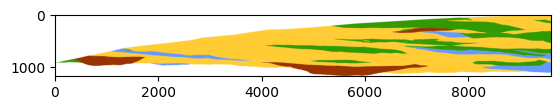

In [50]:
plt.imshow(arr_plot_ref)

In [51]:
print(nx, nz)

300 200


### Multiple levels

In [52]:
cm_test = geone.covModel.CovModel1D(elem=[("cubic", {"w":np.nan, "r":np.nan}),
                                          ("cubic", {"w":np.nan, "r":np.nan})])

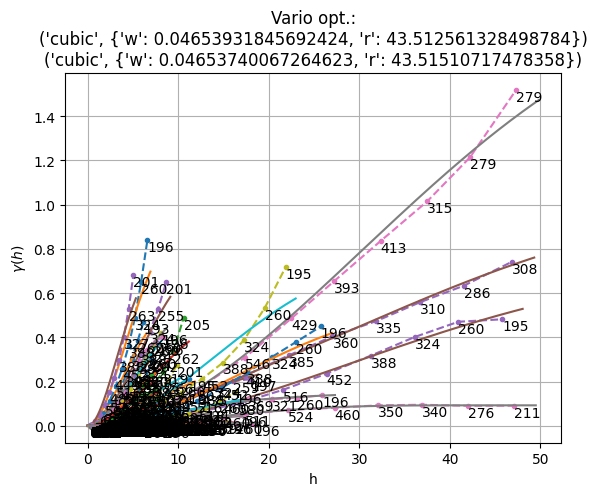

In [53]:
## covmodels
x = []
val = []

h_l = []
v_l = []
p_l = []

cm_l = []
popt = []
plot = True
groups = []

means = []
for iv in dic_surfs["Rank_3"][:]:
    
    ## detect in which group is the line
    c = 0  # counter --> indicates the hierarchical group of the line
    p = iv[int(len(iv[:, 0])/2)]
    for s in dic_surfs["Rank_4"] + dic_surfs["Rank_5"]:
        if p[1] > (np.interp(p[0], s[:, 0], s[:, 1])):
            c += 1
    
    xmax = np.max(iv[:, 0])
    xmin = np.min(iv[:, 0])
    hmax = min(0.8* (xmax - xmin), 50)
    
    mean = np.mean(iv[:, 1])
    if hmax > 5:
        
        means.append(mean)
        
        h,v,p = geone.covModel.variogramExp1D(iv[:, 0], iv[:, 1], make_plot=plot, hmax=hmax)
        
        var = 3
        if not np.isnan(h).any():
            try:
#                 cm_opt = geone.covModel.covModel1D_fit(iv[:, 0], iv[:, 1], cm_test, bounds=((0, 0, 0), 
#                                                                             (var, 2*hmax, 5)),
#                                     p0=(1, 10, 1), hmax=hmax, make_plot=plot)
                cm_opt = geone.covModel.covModel1D_fit(iv[:, 0], iv[:, 1], cm_test, bounds=((0, 0, 0, 0), 
                                                                                            (var, 2*hmax, var, 2*hmax)),
                                                    p0=(1, 10, 1, 10), hmax=hmax, make_plot=plot)
            except:
                cm_opt = None

            if cm_opt is not None:
                
                cm = cm_opt[0]

                for elem in cm.elem:
                    if elem[1]["w"] < 0.05:
                        cm.elem.remove(elem)
                for elem in cm.elem:
                    if elem[1]["w"] < 0.05:
                        cm.elem.remove(elem)
     
                if len(cm.elem) > 0:
                    cm_l.append(cm)
                    popt.append(cm_opt[1])
                    
                    h_l.append(h)
                    v_l.append(v)
                    p_l.append(p)
                    
                    groups.append(c)

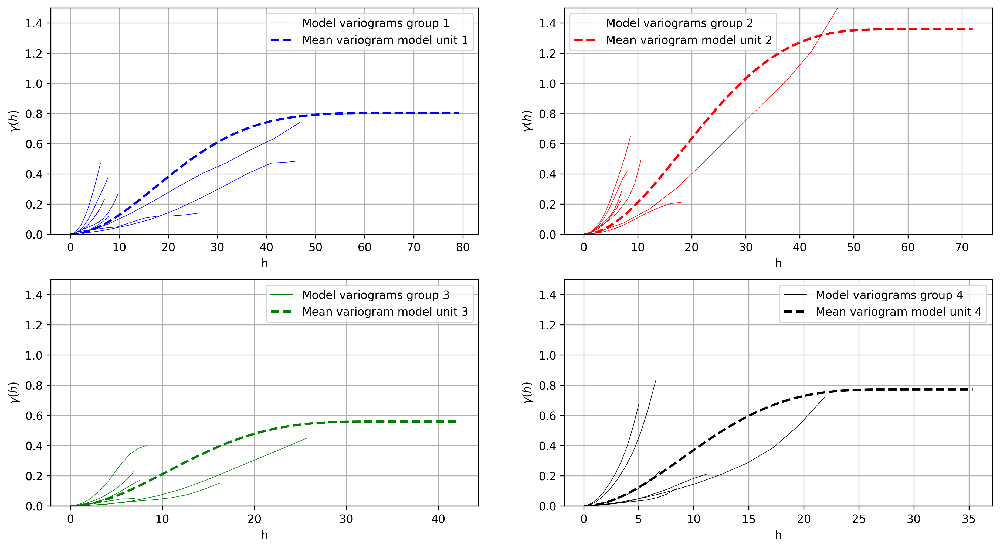

In [54]:
# fig, ax = plt.subplots(2, 2, figsize=(10, 15), dpi=300)

# axes = ax.flatten()
fig = plt.figure(figsize=(15, 8), dpi=300)
colors_list = ["blue", "red", "green", "black", "yellow"]


cm_list_by_group = []
for igroup, c in zip(np.unique(groups), colors_list):
    mask = np.array(groups) == igroup
    
    plt.subplot(2, 2, igroup+1)
    
    for h, v, igroup2 in zip(h_l, v_l, groups):
     
        if igroup2 == igroup:
            plt.plot(h, v, c=c, linewidth=.5)   
            
    plt.plot(h, v, c=c, linewidth=.5, label="Model variograms group {}".format(igroup + 1))
    
    weights = np.array(h_l)[mask, -1] - np.array(h_l)[mask, 0]
    mean_popt = (weights.reshape(-1, 1) * np.array(popt)[mask]).sum(0) / weights.sum()
    
    
    cm_mean_popt_igroup = geone.covModel.CovModel1D(elem=[("cubic", {"w":0.1+mean_popt[0], "r":mean_popt[1]}),
                                                          ("cubic", {"w":0.1+mean_popt[2], "r":mean_popt[3]})])

    cm_mean_popt_igroup.plot_model(1, c=c, linewidth=2, linestyle="--", label="Mean variogram model unit {}".format(igroup + 1))  
    cm_list_by_group.append(cm_mean_popt_igroup)
    
    plt.ylim(0, 1.5)
    plt.legend()
#     plt.show()
    
# plt.legend()
cm_list_by_group.append(cm_mean_popt)  # add a covmodel for last group because there was not enough lines to infer a vario

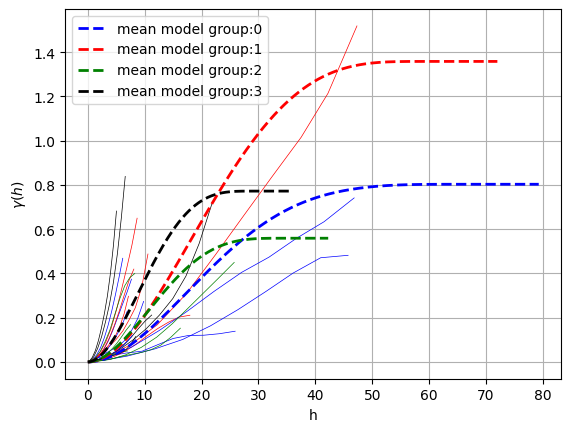

In [55]:
colors_list = ["blue", "red", "green", "black", "yellow"]
for h, v, igroup in zip(h_l, v_l, groups):
    
    if igroup == 0:
        plt.plot(h, v, c="blue", linewidth=.5)
    if igroup == 1:
        plt.plot(h, v, c="red", linewidth=.5)    
    if igroup == 2:
        plt.plot(h, v, c="green", linewidth=.5)   
    if igroup == 3:
        plt.plot(h, v, c="black", linewidth=.5)   

cm_list_by_group = []
for igroup, c in zip(np.unique(groups), colors_list):
    mask = np.array(groups) == igroup


    weights = np.array(h_l)[mask, -1] - np.array(h_l)[mask, 0]
    mean_popt = (weights.reshape(-1, 1) * np.array(popt)[mask]).sum(0) / weights.sum()
    
    
    # cm_mean_popt_igroup = geone.covModel.CovModel1D(elem=[("spherical", {"w":mean_popt[0], "r":mean_popt[1]}),
    #                                          ("cubic", {"w":mean_popt[2], "r":mean_popt[3]}),
    #                                          ("exponential", {"w":mean_popt[4], "r":mean_popt[5]})])

    cm_mean_popt_igroup = geone.covModel.CovModel1D(elem=[("cubic", {"w":0.1+mean_popt[0], "r":mean_popt[1]}),
                                                          ("cubic", {"w":0.1+mean_popt[2], "r":mean_popt[3]})])

    cm_mean_popt_igroup.plot_model(1, c=c, linewidth=2, linestyle="--", label="mean model group:{}".format(igroup))  
    cm_list_by_group.append(cm_mean_popt_igroup)


plt.legend()
cm_list_by_group.append(cm_mean_popt)  # add a covmodel for last group because there was not enough lines to infer a vario

In [56]:
dic_surfs["Rank_4"][0].mean(0)

array([79.77729132,  8.23166007])

In [57]:
dic_surfs["Rank_4"][1].mean(0)

array([66.2929088 ,  3.94921147])

In [58]:
dic_surfs["Rank_4"][2].mean(0)

array([98.37069059, 10.58960191])

In [59]:
dic_surfs["Rank_5"][0].mean(0)

array([74.7810687 ,  5.75793366])

In [60]:
alt = [3.9, 5.75, 8.23, 10.59]
covs = [cm_r4, cm_r5, cm_r4, cm_r4]

sims = []
for i in range(len(alt)):
    
    sim = geone.multiGaussian.multiGaussianRun(covs[i], nx, sx, output_mode="array", mean=alt[i])[0]
    sim[sim > top] = top[sim > top]
    sim[sim < bot] = bot[sim < bot]
    
    for o in range(i):  # erosion rules
        s2 = sims[o]  # older surface
        
        mask = s2 > sim
        s2[mask] = sim[mask]
    sims.append(sim)

In [61]:
def surfs_int(alt, covs, top, bot):
    
    sims = []
    for i in range(len(alt)):
        
        mean = (np.exp(-.04*xg) * 5) + alt[i]
        
        sim = geone.multiGaussian.multiGaussianRun(covs[i], nx, sx, output_mode="array", mean=mean)[0]
        sim[sim > top] = top[sim > top]
        sim[sim < bot] = bot[sim < bot]

        for o in range(i):  # erosion rules
            s2 = sims[o]  # older surface

            mask = s2 > sim
            s2[mask] = sim[mask]
        sims.append(sim)
    
    return sims

(0.0, 117.0)

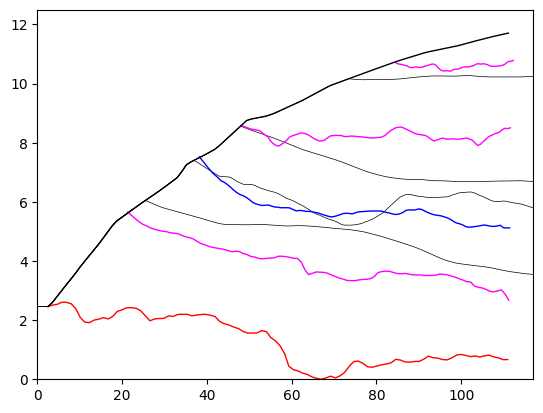

In [62]:
high_surfs = surfs_int(alt, covs, top, bot) 

for s in high_surfs:
    plt.plot(xg, s, c="k", linewidth=.5)


for k,v in dic_surfs.items():
    if k == "Rank_3":
        pass
    else:
        for test in v:
            plt.plot(test[:, 0], test[:, 1], linewidth=1, c=d_color[k])

plt.ylim(0, 12.5)
plt.xlim(0, 117)

In [63]:
bhs

[(33.3, 7.03, [(843, 7.03), (230, 4.01), (843, 3.33)]),
 (39.79, 7.65, [(843, 7.65), (230, 3.43), (843, 3.09)]),
 (59.23, 9.18, [(843, 9.18), (68, 5.82), (843, 5.1), (366, 2.15)]),
 (109.71,
  11.56,
  [(843, 11.56),
   (68, 9.02),
   (843, 8.69),
   (68, 8.08),
   (843, 7.1),
   (68, 5.23),
   (230, 4.82),
   (68, 4.63),
   (230, 4.02),
   (843, 3.59),
   (68, 2.58),
   (230, 1.89),
   (843, 1.02)])]

In [64]:
alt

[3.9, 5.75, 8.23, 10.59]

In [65]:
def proto_HEROS(ngroups, covmodel_by_groups, proba_by_groups, facies_ids,
                N_by_group, alpha_by_group, xi_by_group,  # EROS params by group
                top, bot, alt, covs,  # intermediate surface params
                w_logs=None,  # well logs
                nreal=1, seed=None
                 ):
    
    np.random.seed(seed)  # set seed
    
    all_surfs = []
    all_sims = []
    all_high_surfs = []
    
    for ireal in range(nreal):
        print("sims {}".format(ireal))

        high_surfs = surfs_int(alt, covs, top, bot)  # simulate intermediate levels
        
        surfs = []
        arr_final = np.zeros([nz, nx], dtype=int)
        
        for i in range(ngroups):

            seed = np.random.randint(1e6)

            # EROS params
            if hasattr(N_by_group, "__iter__"):
                N_i = N_by_group[i]
            else:
                N_i = N_by_group
                
            if hasattr(proba_by_groups, "__iter__"):
                proba_i = proba_by_groups[i]
            else:
                proba_i = proba_by_groups

            if hasattr(covmodel_by_groups, "__iter__"):
                covmodel_i = covmodel_by_groups[i]
            else:
                covmodel_i = covmodel_by_groups

            if hasattr(alpha_by_group, "__iter__"):
                alpha_i = alpha_by_group[i]
            else:
                alpha_i = alpha_by_group
                
            if hasattr(xi_by_group, "__iter__"):
                xi_i = xi_by_group[i]
            else:
                xi_i = xi_by_group

            ## intermediate bot/top    
            if i > 0:
                bot_int = high_surfs[i-1]
                min_v = alt[i-1]
            else:
                bot_int = bot 
                min_v = np.min(bot)

            if i < len(proba_by_groups) - 1:
                top_int = high_surfs[i]
                max_v = alt[i]
            else:
                top_int = top
                max_v = np.max(top)

        #     top_int[top_int < bot_int] = bot_int[top_int < bot_int]
            height = max_v - min_v

            #means = np.sort(np.random.uniform(min_v - 0.1 * height, max_v + 0.1 * height, size=N_i))
            means = np.linspace(min_v - 0.1 * height, max_v + 0.1 * height, N_i)
            
            # assign to a certain fraction of the surface, a non-stationary means with the function (np.exp(-.04*xg) * 5) + means[i]
            new_means = []
            for i in range(len(means)):
                if np.random.rand() < 0.5:
                    meansi = (np.exp(-.04*xg) * 5) + means[i]
                else:
                    meansi = np.ones(len(xg)) * means[i]
                
                new_means.append(meansi)
            
            means = np.array(new_means)

            if w_logs is not None:
                # cut logs by top_int and bot_int
                w_logs_int = []
                for w in w_logs:
                    log = []
                    bot_int_w = np.interp(w[0], xg, bot_int)
                    top_int_w = np.interp(w[0], xg, top_int)
                    depth = top_int_w - bot_int_w
                    for iso in range(len(w[2])):

                        s1 = w[2][iso]
                        if iso < len(w[2]) - 1:
                            s2 = w[2][iso+1]
                        else:
                            s2 = (s1[0], bot_int_w)
                        
                        if s1[1] > top_int_w and s2[1] < top_int_w:
                            log.append((s1[0], top_int_w))
                        elif s1[1] < top_int_w and s1[1] > bot_int_w:
                            log.append(s1)
                        elif s1[1] < bot_int_w:
                            pass

                    if depth > 0:
                        w_logs_int.append((w[0], depth, log))

            else:
                w_logs_int = []

            if len(w_logs_int) == 0:
                real_surf, arr_res, list_p_cond = EROS.sim_uncond_2D(N_i, covmodel_i, means, (nx, nz), (sx, sz), (0, 0),
                                                                    bot = bot_int, top = top_int, xi = xi_i,
                                                                    proba=proba_i, facies_ids = facies_ids,
                                                                    alpha=alpha_i, seed=seed)
            else:
                real_surf, arr_res, list_p_cond = EROS.sim_cond_2D(N_i, covmodel_i, means, (nx, nz), (sx, sz), (0, 0),
                                                                    bot = bot_int, top = top_int, xi = xi_i,
                                                                    proba_cdf=proba_i, facies_ids = facies_ids,
                                                                    w_logs = w_logs_int,
                                                                    alpha=alpha_i, seed=seed)

            arr_final[arr_res != -99] = arr_res[arr_res != -99]
            surfs.append(real_surf)
            
        arr_final[arr_final==0] = -99  # set unknown values to -99
        surfs = np.concatenate(surfs)  # concatenate the surfaces
        
        all_surfs.append(surfs)
        all_sims.append(arr_final)
        all_high_surfs.append(high_surfs)
        
    return all_sims, all_surfs, all_high_surfs

In [66]:
proba1 = (0.10, 0.15, 0.1, 0.70)
proba2 = (0.08, 0, 0.12, 0.8)
proba3 = (0.05, 0, 0.22, 0.73)
proba4 = (0, 0.10, 0.5, 0.4)
proba5 = (0, 0, 0.1, 0.9)
probas_all = [proba1, proba2, proba3, proba4, proba5]

Ns = [20, 15, 10, 10, 3]
alpha_by_group = [0.5, 0.5, 0.5, 0.9, 0.8]

In [67]:
fontsize_title=11

In [68]:
probas_all

[(0.1, 0.15, 0.1, 0.7),
 (0.08, 0, 0.12, 0.8),
 (0.05, 0, 0.22, 0.73),
 (0, 0.1, 0.5, 0.4),
 (0, 0, 0.1, 0.9)]

In [69]:
facies_ids

[230, 366, 68, 843]

In [70]:
sims, surfs, high_surfs = proto_HEROS(5, cm_list_by_group, probas_all, facies_ids,
                                       Ns, alpha_by_group, 0.2,
                                      top=top, bot=bot,
                                      alt=alt, covs=covs,
                                      nreal=3, seed=700)

sims 0
sims 1
sims 2


In [71]:
matplotlib.rcParams.update({'font.size': 12})

(0.0, 12.5)

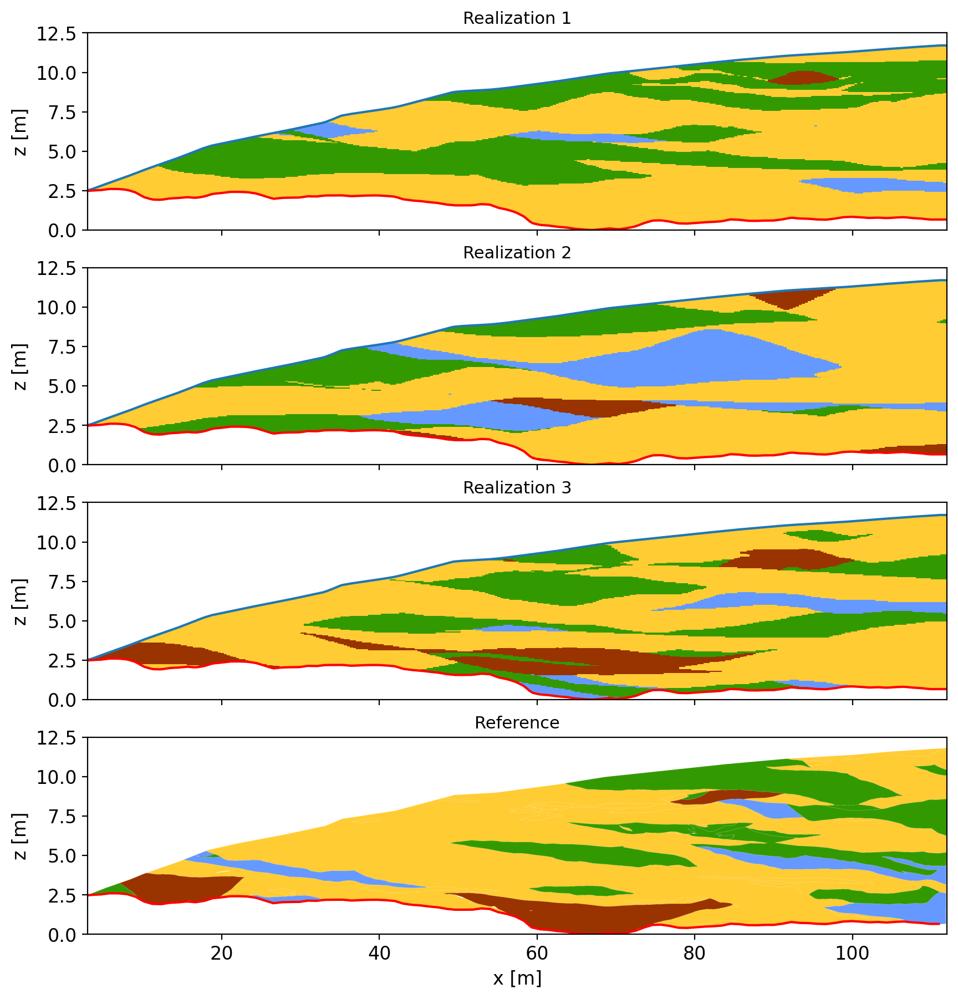

In [72]:
## vizu
fig,ax = plt.subplots(4, 1, figsize=(10, 11), dpi=200, sharex=True)
plt.subplots_adjust(hspace=0)

for i in range(3):
    
    axi = ax[i]
    
    arr_plot = np.zeros([nz, nx, 3])
    arr_final = sims[i]
    real_surf = surfs[i]
    
    o = 0
    for ival in np.unique(arr_final):
        if ival == -99:
            arr_plot[arr_final==-99] = (1, 1, 1)
        else:
            arr_plot[arr_final==ival] = colors[ival][:3]
            o += 1

    axi.imshow(arr_plot, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)
    axi.set_ylabel("z [m]")
    axi.set_title("Realization {}".format(i+1), fontsize=fontsize_title)
    axi.plot(xg, top)
    axi.plot(xg, bot, c="r")

axi = ax[-1]

for k,v in dic_surfs.items():
    if k == "Rank_7":
        for test in v:
            axi.plot(test[:, 0], test[:, 1], linewidth=1.5, c=d_color[k])
            
axi.set_xlabel("x [m]")
axi.set_ylabel("z [m]")
axi.set_title("Reference", fontsize=fontsize_title)
axi.imshow(arr_plot_ref, extent=[ox+3, x1-5, oz, z1-.7], aspect=2)
axi.set_ylim(0, 12.5)

# fig.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_nolines.png", bbox_inches='tight')

(0.0, 12.5)

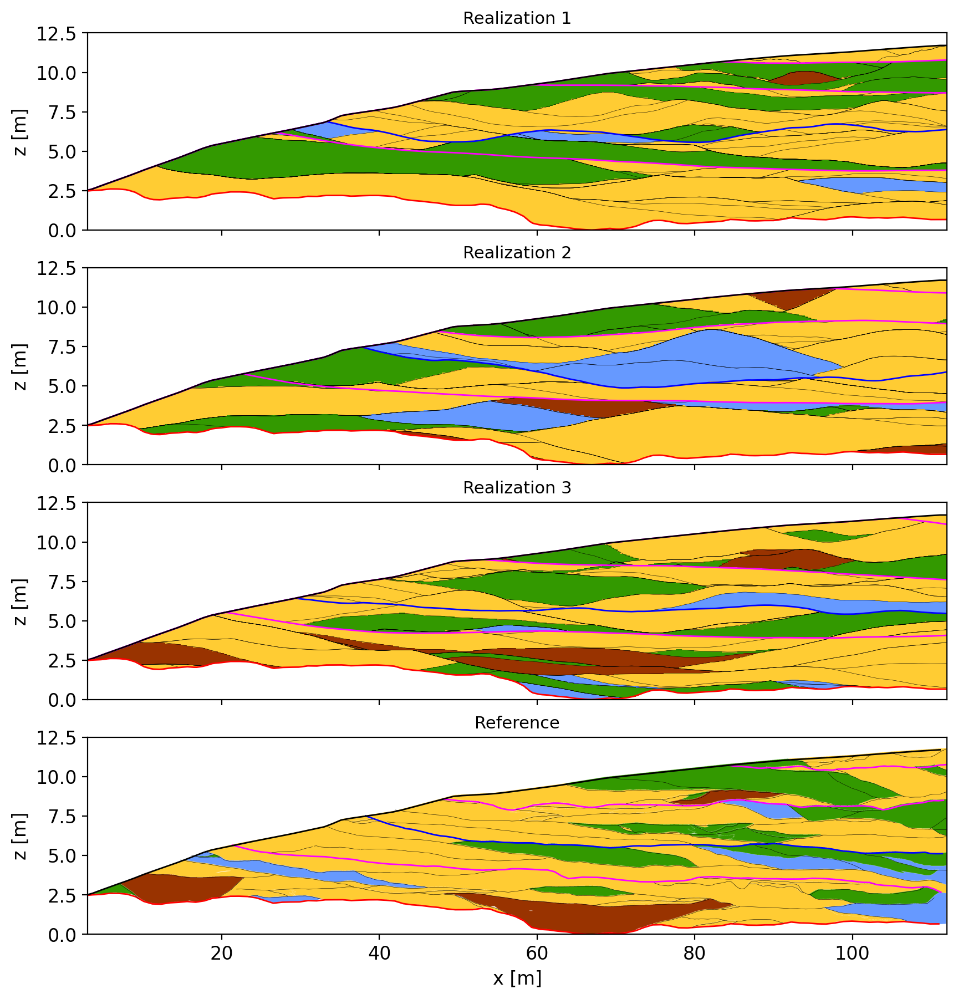

In [73]:
## vizu
fig,ax = plt.subplots(4, 1, figsize=(10, 11), dpi=200, sharex=True)
plt.subplots_adjust(hspace=0)

for i in range(3):
    
    axi = ax[i]
    
    arr_plot = np.zeros([nz, nx, 3])
    arr_final = sims[i]
    real_surf = surfs[i]
    
    
    o = 0
    for ival in np.unique(arr_final):
        if ival == -99:
            arr_plot[arr_final==-99] = (1, 1, 1)
        else:
            arr_plot[arr_final==ival] = colors[ival][:3]
            o += 1

    axi.imshow(arr_plot, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)
    axi.set_ylabel("z [m]")
    axi.set_title("Realization {}".format(i+1), fontsize=fontsize_title)
    axi.plot(xg, real_surf.T, c="k", linewidth=.2)
    c_hs = ["fuchsia", "blue", "fuchsia", "fuchsia"]
    o = 0
    for s in high_surfs[i]:
        axi.plot(xg, s, c=c_hs[o], linewidth=1)
        o += 1
    axi.plot(xg, top, linewidth=1, c="k")
    axi.plot(xg, bot, c="r", linewidth=1)
    
axi = ax[-1]
for k,v in dic_surfs.items():
    if k == "Rank_3":
        for test in v:
            axi.plot(test[:, 0], test[:, 1], linewidth=.2, c="k")
    else:
        for test in v:
            axi.plot(test[:, 0], test[:, 1], linewidth=1, c=d_color[k])

axi.set_xlabel("x [m]")
axi.set_ylabel("z [m]")
axi.set_title("Reference", fontsize=fontsize_title)
axi.imshow(arr_plot_ref, extent=[ox+3, x1-5, oz, z1-.7], aspect=2)
axi.set_ylim(0, 12.5)

# fig.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW.png", bbox_inches='tight')

In [74]:
facies_ids[:]

[230, 366, 68, 843]

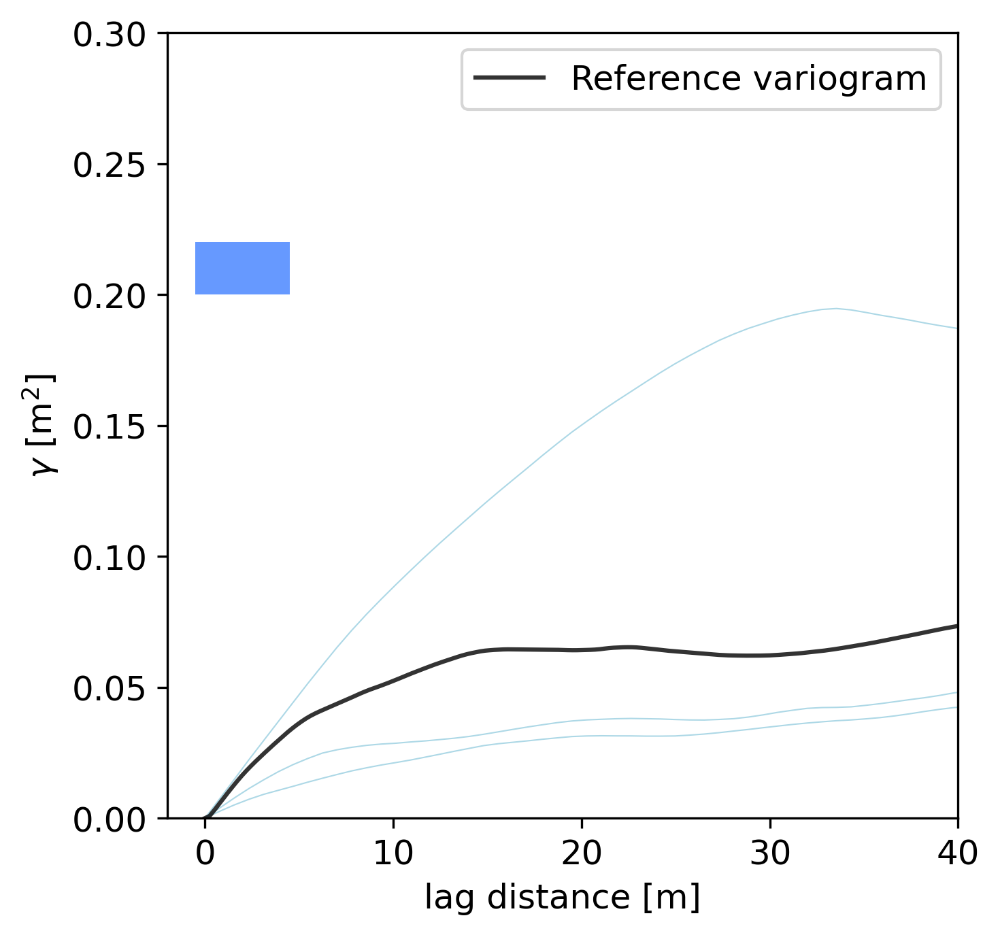

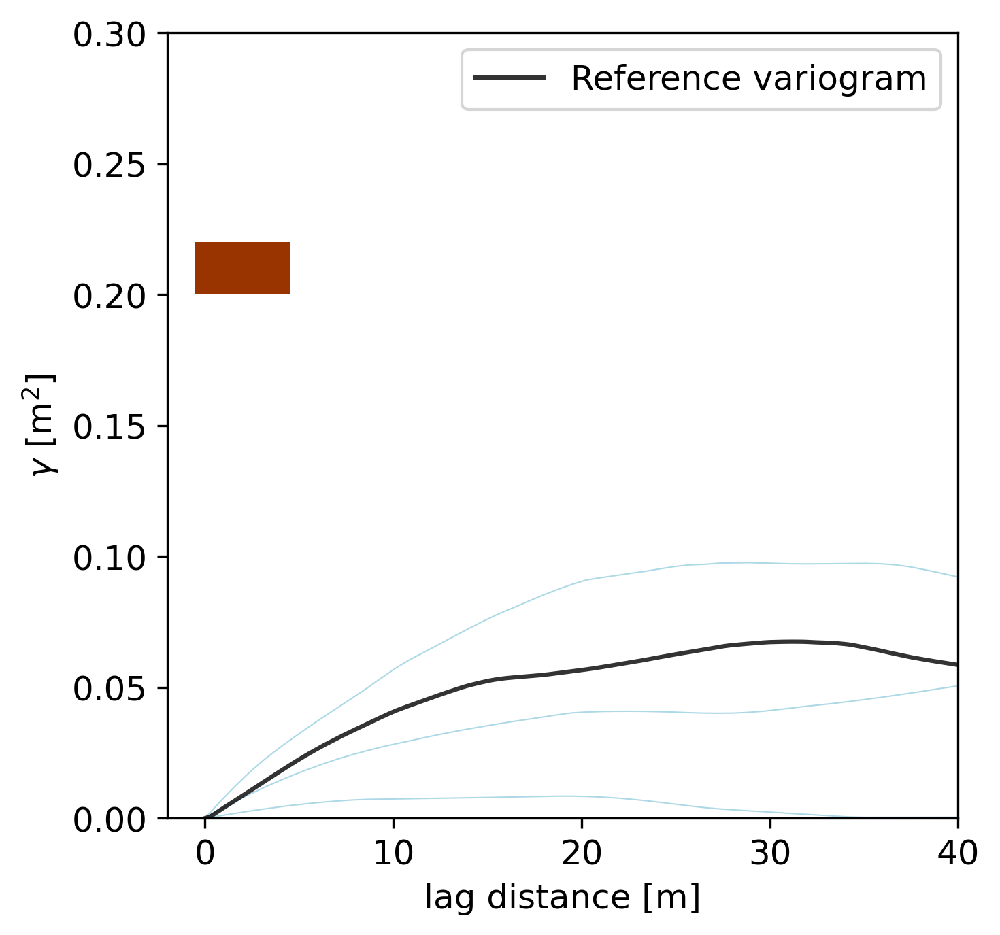

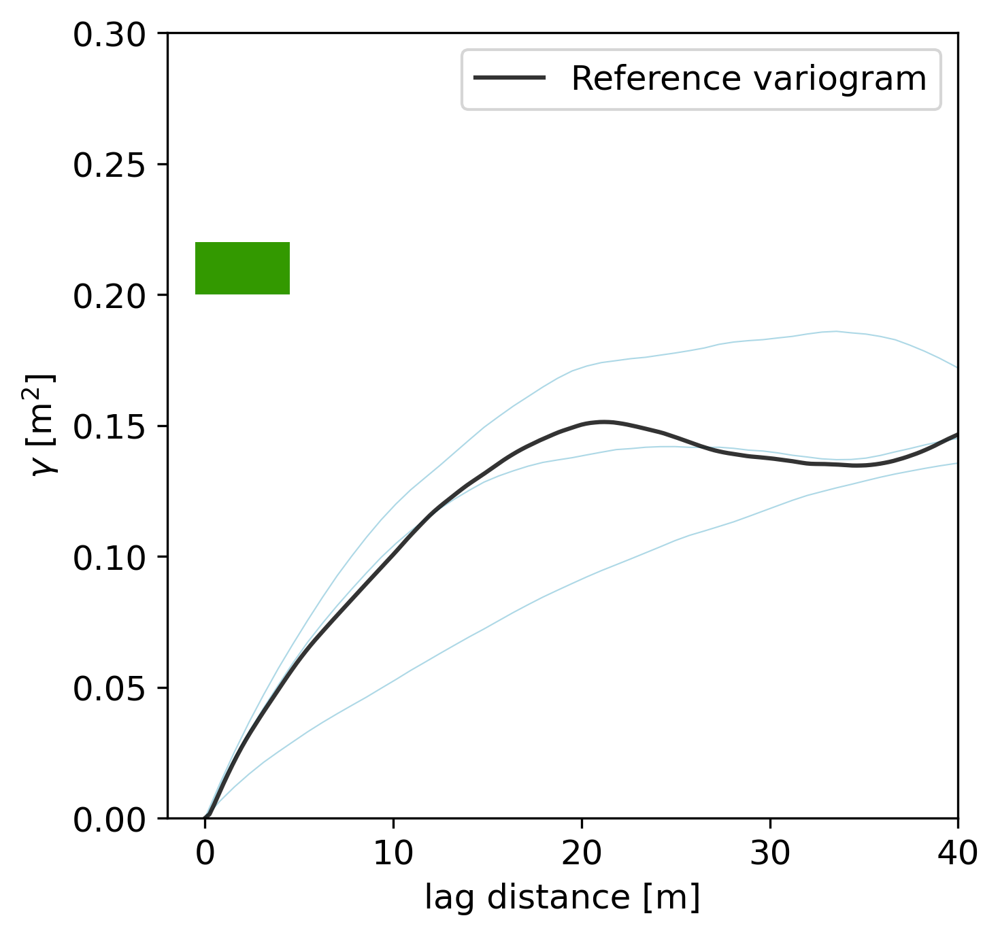

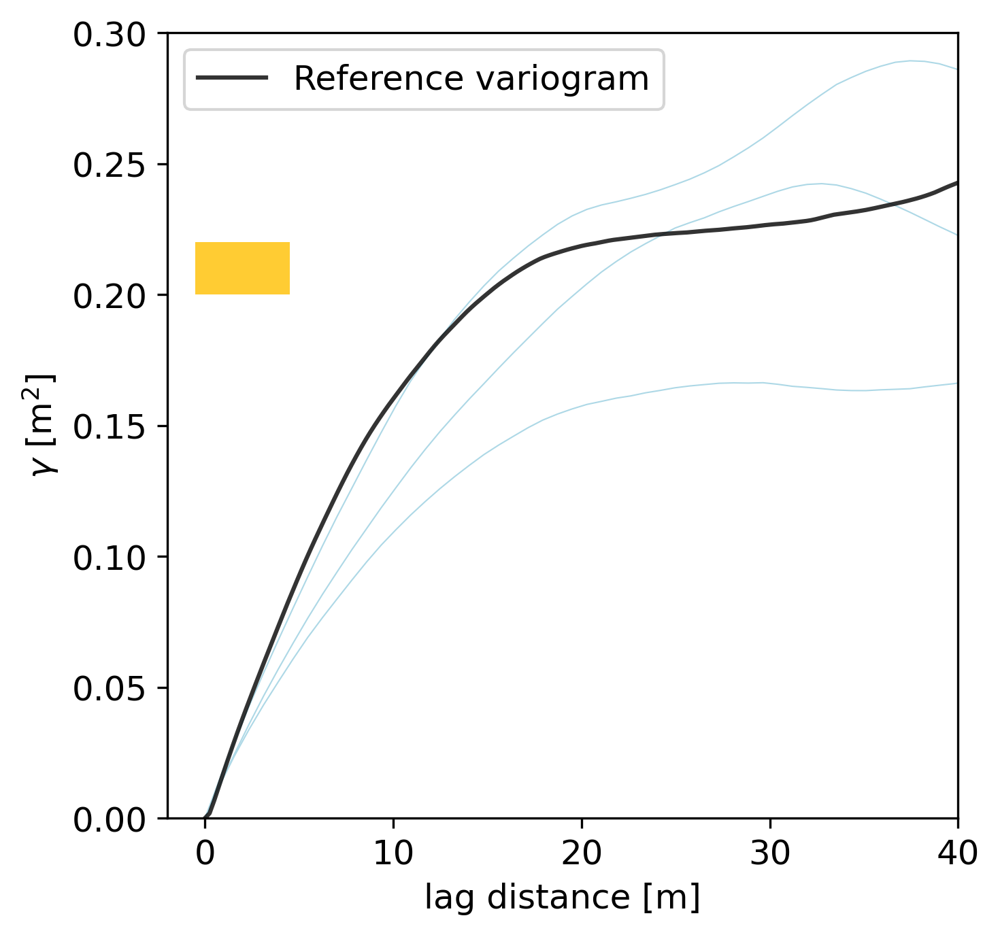

In [75]:
for i, facies_id in enumerate(facies_ids[:]):

    fig = plt.figure(figsize=(5, 5), dpi=300)

    # compute variograms on realizations
    for isim in sims:

        val = isim.astype(float).copy()

        val[val != facies_id] = 0
        val[val == facies_id] = 1

        val[isim == -99] = np.nan

        im_sim = geone.img.Img(nx=nx, ny=nz, nz=1, nv=1, val=val, sx=sx, sy=sz, sz=1, ox=ox, oy=oz, oz=0)

        im_sim_1_cov = geone.geosclassicinterface.imgTwoPointStatisticsImage(im_sim, 0, hx_min=-110, hx_max=110, hy_min=-50, hy_max=50, hx_step=2, hy_step=2, stat_type="variogram")

        x = im_sim_1_cov.sx * np.arange(int(im_sim_1_cov.nx/2 + 1))
        y = im_sim_1_cov.sy * np.arange(int(im_sim_1_cov.ny/2 + 1))
        # plt.subplot(2, 2, i+1)
        plt.plot(x, im_sim_1_cov.val[0, 0, int(im_sim_1_cov.ny/2), int(im_sim_1_cov.nx/2):], c="lightblue", linewidth=.5)

        # plot a rectangle of the color of the facies
        color = colors[facies_id]
        plt.bar(2, .02, bottom=0.2, color=color, width=5)

        # plt.title("Facies {}".format(facies_id))

    plt.plot(varios_hor[i][0][:-18], varios_hor[i][1][:-18], c="k", alpha=0.8, label="Reference variogram")
    plt.legend()

    plt.ylim(0, 0.3)
    plt.xlim(-2, 40)

    plt.xlabel("lag distance [m]")
    plt.ylabel(r"$\gamma$ [m$^2$]")

    # plt.savefig("../../../figures/articles/EROS/raw_images/Bum_EW_variogram_facies_{}.png".format(facies_id), bbox_inches='tight')
    # plt.close()

([], [])

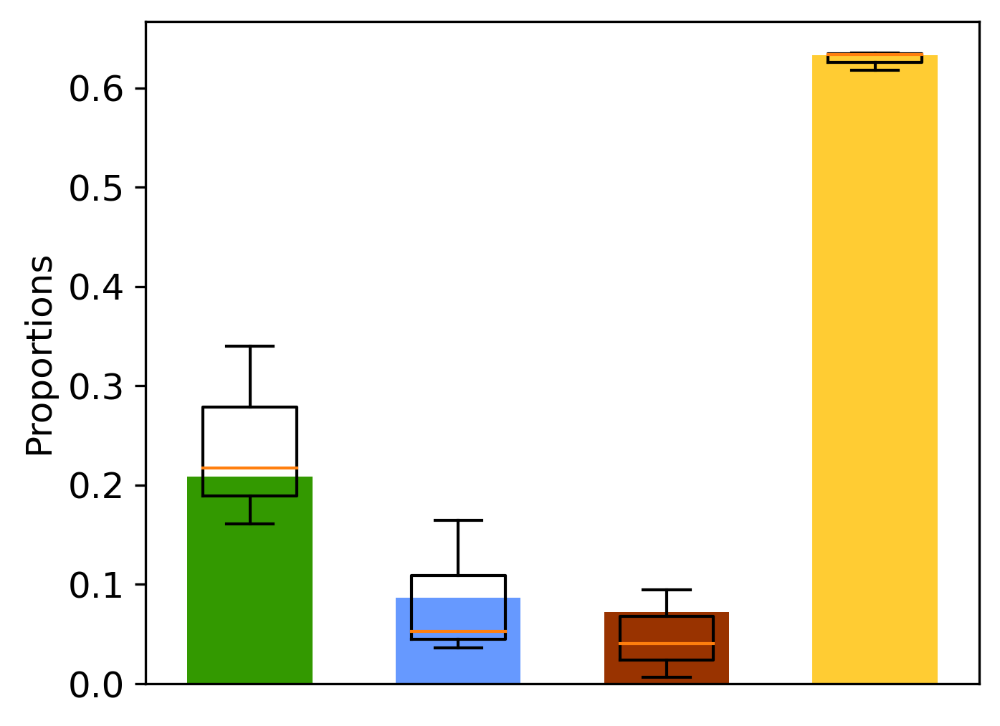

In [76]:
# analyze proportions in realizations
total_counts = []

for isim in sims:

    val = isim.astype(float).copy()
    ids, counts = np.unique(val, return_counts=True)
    counts = counts[1:]
    ids = ids[1:]
    counts = counts / counts.sum()
    total_counts.append(counts)

total_counts = np.array(total_counts)
# plot
plt.figure(figsize=(5, 4), dpi=300)

# plot reference proportions
proba_ref = [probas[2], probas[1], probas[0], probas[3]]
for i in range(0, len(colors)):
    color = colors[ids[i]]
    plt.bar(i+1, proba_ref[i], bottom=0, color=color, width=.6, alpha=1, label="Ref. prop {}".format(i+1))
    
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

# box plot of proportions

plt.boxplot(total_counts, labels=["1", "2", "3", "4"], showfliers=False)
plt.ylabel("Proportions", fontsize=12)
plt.xticks([])

# plt.savefig("../../../figures/articles/EROS/raw_images/Bum_EW_proportions.png", bbox_inches='tight')

### Conditional simulations

In [85]:
%autoreload 2

In [86]:
import EROS

In [87]:
probas_all

[(0.1, 0.15, 0.1, 0.7),
 (0.08, 0, 0.12, 0.8),
 (0.05, 0, 0.22, 0.73),
 (0, 0.1, 0.5, 0.4),
 (0, 0, 0.1, 0.9)]

In [97]:
sims, surfs, high_surfs = proto_HEROS(5, cm_list_by_group, probas_all, facies_ids,
                                       Ns, alpha_by_group, 0.2,
                                      top=top, bot=bot,
                                      alt=alt, covs=covs, w_logs=bhs,
                                      nreal=3, seed=8)

sims 0
sims 1
sims 2


In [82]:
cm_list_by_group[0]

*** CovModel1D object ***
name = 'cov1D-multi-contribution'
number of elementary contribution(s): 2
elementary contribution 0
    type: cubic
    parameters:
        w = 0.28246643727499515
        r = 49.64952141966001
elementary contribution 1
    type: cubic
    parameters:
        w = 0.5206207770778828
        r = 66.05902725352011
*****

(0.0, 12.5)

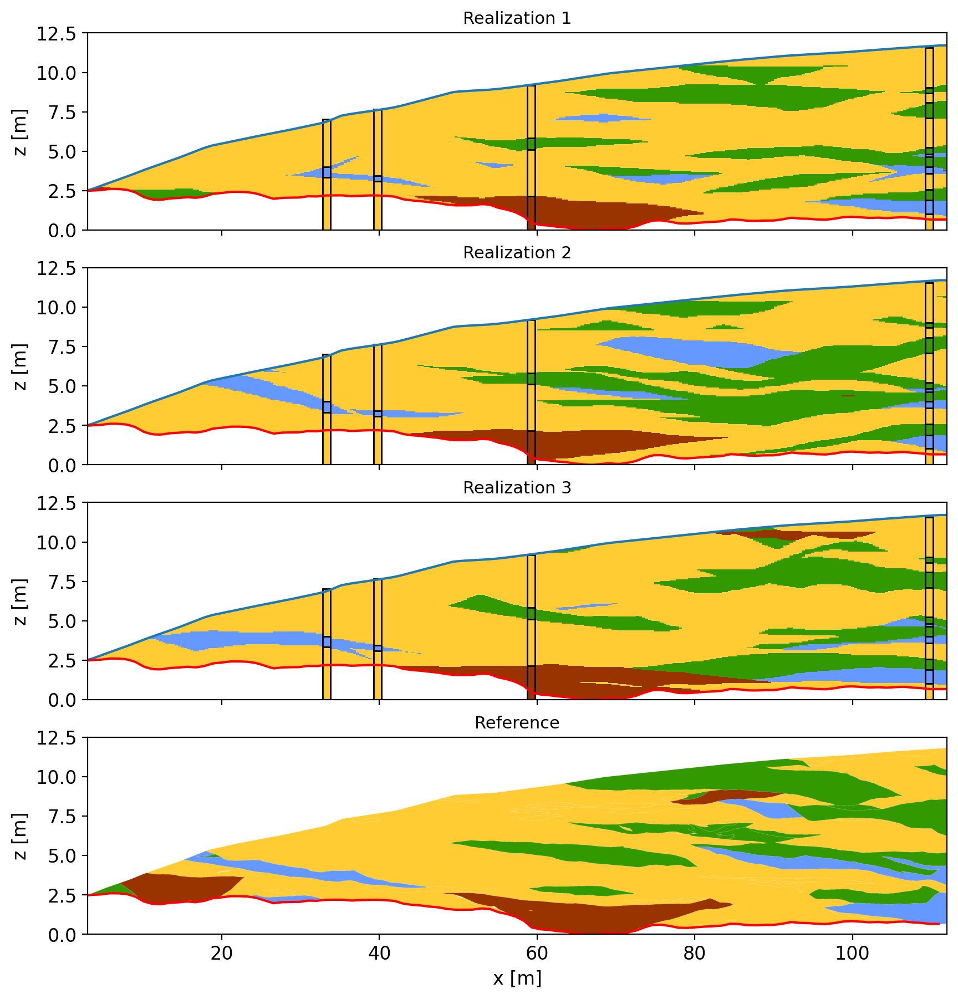

In [98]:
fig,ax = plt.subplots(4, 1, figsize=(10, 11), dpi=200, sharex=True)
plt.subplots_adjust(hspace=0)

for i in range(3):
    
    axi = ax[i]
    
    arr_plot = np.zeros([nz, nx, 3])
    arr_final = sims[i]
    real_surf = surfs[i]
    
    o = 0
    for ival in np.unique(arr_final):
        if ival == -99:
            arr_plot[arr_final==-99] = (1, 1, 1)
        else:
            arr_plot[arr_final==ival] = colors[ival][:3]
            o += 1

    axi.imshow(arr_plot, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)
    axi.set_ylabel("z [m]")
    axi.set_title("Realization {}".format(i+1), fontsize=fontsize_title)
    axi.plot(xg, top)
    axi.plot(xg, bot, c="r")
    plot_bh(bhs, colors=colors, ax=axi)

axi = ax[-1]

for k,v in dic_surfs.items():
    if k == "Rank_7":
        for test in v:
            axi.plot(test[:, 0], test[:, 1], linewidth=1.5, c=d_color[k])
            
axi.set_xlabel("x [m]")
axi.set_ylabel("z [m]")
axi.set_title("Reference", fontsize=fontsize_title)
axi.imshow(arr_plot_ref, extent=[ox+3, x1-5, oz, z1-.7], aspect=2)
axi.set_ylim(0, 12.5)

# fig.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_nolines_cond.png", bbox_inches='tight')

In [99]:
d_color

{'Rank_3': 'darkorange',
 'Rank_4': 'fuchsia',
 'Rank_5': 'blue',
 'Rank_7': 'red',
 'Top': 'black'}

(0.0, 12.5)

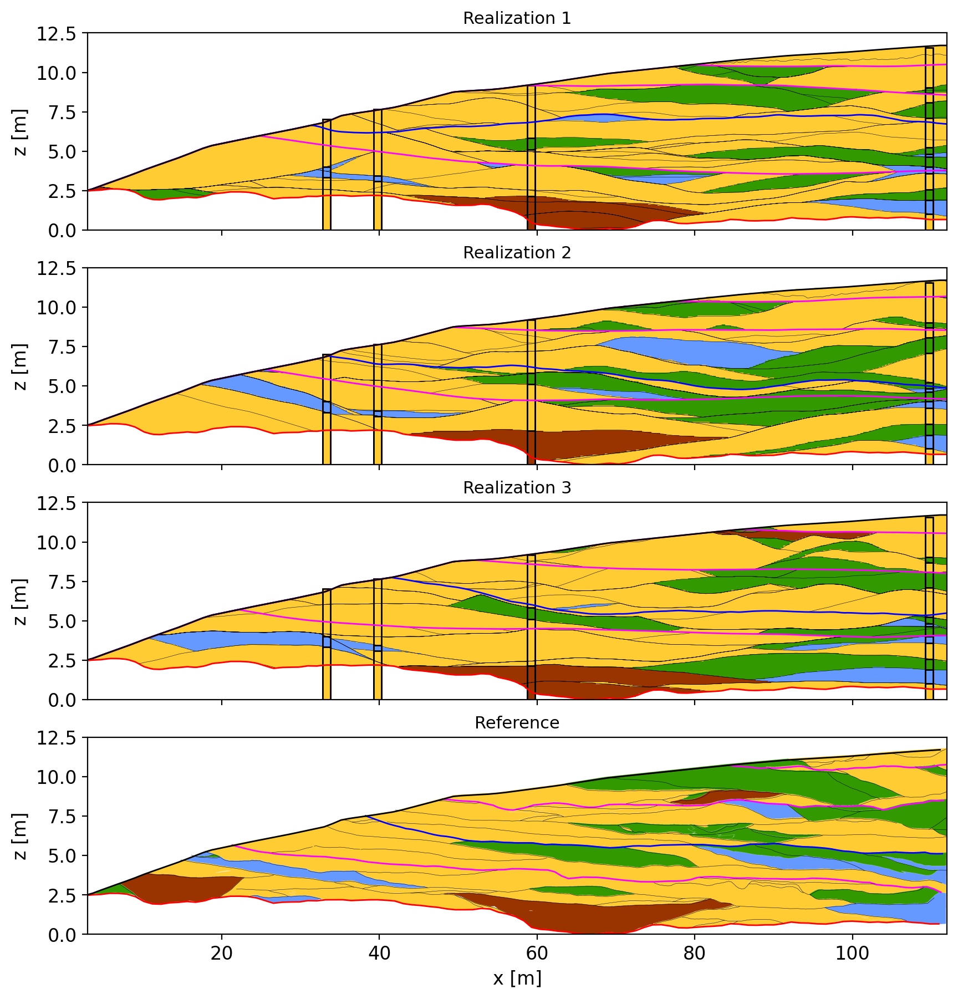

In [100]:
## vizu
fig,ax = plt.subplots(4, 1, figsize=(10, 11), dpi=200, sharex=True)
plt.subplots_adjust(hspace=0)

for i in range(3):
    
    axi = ax[i]
    
    arr_plot = np.zeros([nz, nx, 3])
    arr_final = sims[i]
    real_surf = surfs[i]
    
    
    o = 0
    for ival in np.unique(arr_final):
        if ival == -99:
            arr_plot[arr_final==-99] = (1, 1, 1)
        else:
            arr_plot[arr_final==ival] = colors[ival][:3]
            o += 1

    axi.imshow(arr_plot, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)
    axi.set_ylabel("z [m]")
    axi.set_title("Realization {}".format(i+1), fontsize=fontsize_title)
    axi.plot(xg, real_surf.T, c="k", linewidth=.2)

    c_hs = ["fuchsia", "blue", "fuchsia", "fuchsia"]
    o = 0
    for s in high_surfs[i]:
        axi.plot(xg, s, c=c_hs[o], linewidth=1)
        o += 1
    plot_bh(bhs, colors=colors, ax=axi)
    axi.plot(xg, top, linewidth=1, c="k")
    axi.plot(xg, bot, c="r", linewidth=1)

axi = ax[-1]
for k,v in dic_surfs.items():
    if k == "Rank_3":
        for test in v:
            axi.plot(test[:, 0], test[:, 1], linewidth=.2, c="k")
    else:
        for test in v:
            axi.plot(test[:, 0], test[:, 1], linewidth=1, c=d_color[k])

axi.set_xlabel("x [m]")
axi.set_ylabel("z [m]")
axi.set_title("Reference", fontsize=fontsize_title)
axi.imshow(arr_plot_ref, extent=[ox+3, x1-5, oz, z1-.7], aspect=2)
axi.set_ylim(0, 12.5)

# fig.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_lines_cond.png", bbox_inches='tight')

## flow simulation comparison with SIS

In [ ]:
nreal = 50
np.random.seed(12)
all_eros_sims = []
while len(all_eros_sims) < nreal:
    try:
        sims, surfs, high_surfs = proto_HEROS(5, cm_list_by_group, probas_all, facies_ids,
                                        Ns, alpha_by_group, 0.2,
                                        top=top, bot=bot,
                                        alt=alt, covs=covs, w_logs=bhs,
                                        nreal=1, seed=None)
        all_eros_sims.append(sims)
    except:
        pass

sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
1 gne
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0
sims 0


In [ ]:
mask = arr_final == -99

In [ ]:
def resample_to_grid(xc, yc, rxc, ryc, raster_band, method="nearest"):

    """
    Function to resample the raster data to a
    user supplied grid of x, y coordinates.

    x, y coordinate arrays should correspond
    to grid vertices

    Parameters
    ----------
    xc: np.ndarray or list
        an array of x-cell centers
    yc: np.ndarray or list
        an array of y-cell centers
    rxc: ndarray
         raster xcell centers
    ryc: ndarray
         raster ycell centers
    raster_band: 2D ndarray
        raster band to re-sample
    method: str
        scipy interpolation method options

        "linear" for bi-linear interpolation
        "nearest" for nearest neighbor
        "cubic" for bi-cubic interpolation

    Returns
    -------
        np.array

    """

    from scipy.interpolate import griddata

    #get some info and output grid
    data_shape=xc.shape
    xc=xc.flatten()
    yc=yc.flatten()

    # step 2: flatten raster grid
    rxc=rxc.flatten()
    ryc=ryc.flatten()

    #flatten array
    arr=raster_band.flatten()

    # interpolation
    data=griddata((rxc, ryc), arr, (xc, yc), method=method)

    #rearrange shape
    data=data.reshape(data_shape)

    return data

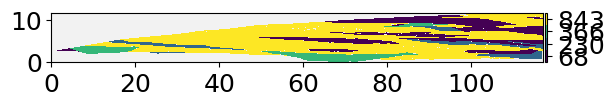

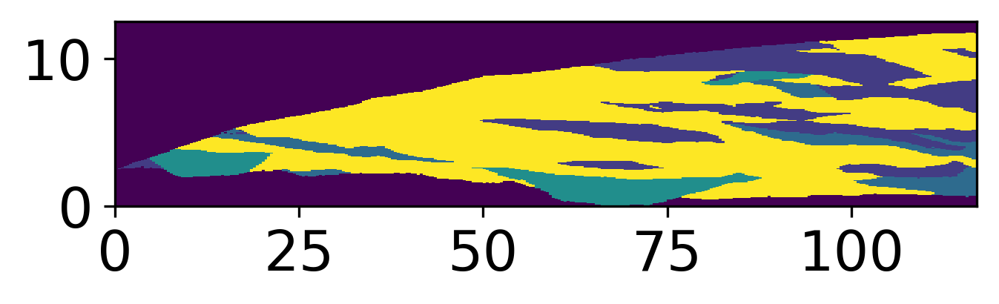

In [ ]:
# resample reference to simulation grid
xc, zc = np.meshgrid(xg, zg)

xc = xc.flatten()
zc = zc.flatten()

# reference
geone.imgplot.drawImage2D(im[0], categ=True)

raster_band = im[0].val[0, 0]
rxc = im[0].xx().flatten()
ryc = im[0].yy().flatten()

# resample
new_ref = resample_to_grid(xc, zc, rxc, ryc, raster_band, method="nearest")
new_ref[np.isnan(new_ref) & mask.flatten()] = -99
new_ref = new_ref.reshape(nz, nx)

# fill unknown values
# fill nan values with nearest value (nearest neighbor)

# import nearest neighbor
from scipy.interpolate import griddata

# get the coordinates of the nan values
coords = np.argwhere(np.isnan(new_ref))

# get the coordinates of the non nan values
coords_non_nan = np.argwhere(~np.isnan(new_ref))

# get the values of the non nan values
values = new_ref[~np.isnan(new_ref)]

# interpolate the nan values
new_ref[coords[:, 0], coords[:, 1]] = griddata(coords_non_nan, values, coords, method="nearest")

# plot
plt.figure(figsize=(5, 5), dpi=300)
plt.imshow(new_ref, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)

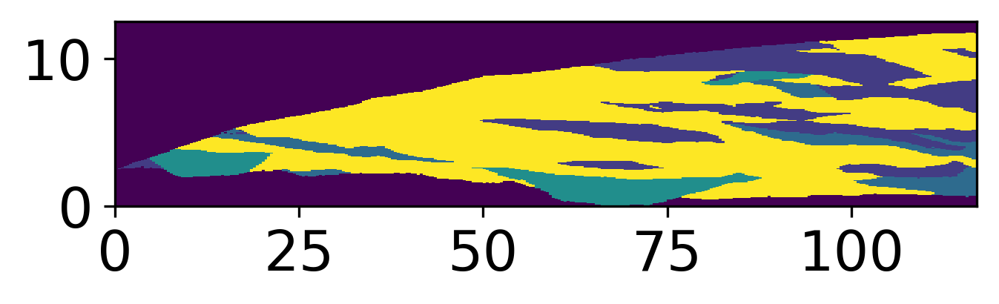

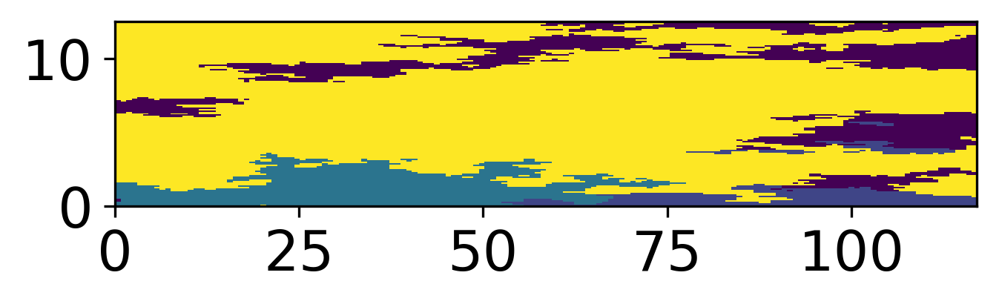

In [ ]:
plt.figure(figsize=(5, 5), dpi=300)
plt.imshow(new_ref, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)

plt.figure(figsize=(5, 5), dpi=300)
plt.imshow(arr_final, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)

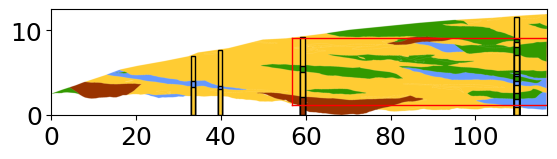

In [ ]:
# select the zone where to simulate flow and transport
x_min = 145
x_max = 299
y_min = 20
y_max = 145

# coordinates
x_min_coord = xg[x_min]
x_max_coord = xg[x_max]
y_min_coord = zg[y_min]
y_max_coord = zg[y_max]

# plot a red rectangle
# plt.imshow(new_ref[y_min:y_max, x_min:x_max], extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=1)
plt.imshow(arr_plot_ref, extent=[ox, x1, oz, z1-.7], aspect=2)
plt.ylim(0, 12.5)
plt.plot([x_min_coord, x_max_coord], [y_min_coord, y_min_coord], c="r", linewidth=1)
plt.plot([x_min_coord, x_max_coord], [y_max_coord, y_max_coord], c="r", linewidth=1)
plt.plot([x_min_coord, x_min_coord], [y_min_coord, y_max_coord], c="r", linewidth=1)
plt.plot([x_max_coord, x_max_coord], [y_min_coord, y_max_coord], c="r", linewidth=1)

plot_bh(bhs, colors=colors, ax=plt.gca())   

In [ ]:
np.unique(new_ref)

array([-99.,  68., 230., 366., 843.])

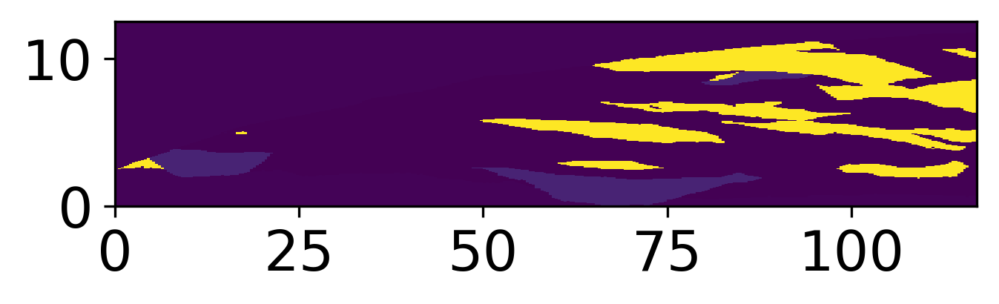

In [ ]:
dic_facies_k = {68:1e-1,
                230: 1e-4, 
                366:1e-2, 
                843: 1e-5}
ref_k = np.ones(new_ref.shape) * 1e-3
for k,v in dic_facies_k.items():
    ref_k[new_ref == k] = v

plt.figure(figsize=(5, 5), dpi=300)
plt.imshow(ref_k, extent=[ox, x1, oz, z1], origin="lower", interpolation="none", alpha=1, aspect=2)

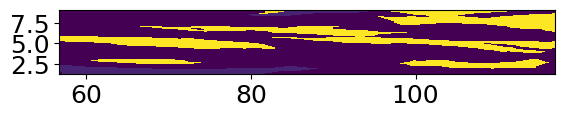

In [ ]:
plt.imshow(ref_k[y_min:y_max, x_min:x_max], extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=1)

### Reference flow

In [ ]:
import flopy
# setup flopy model --> 2D model

# BC flow from right to left (0.1 m at the right boundary, 0 m at the left boundary)

workspace = "workspace"
name = "EROS_2Dflow"
# Create the Flopy simulation object
sim = flopy.mf6.MFSimulation(
    sim_name=name, exe_name="../../../prog/modfow/exe/win64/mf6.exe", version="mf6", sim_ws=workspace
)

# Create the Flopy temporal discretization object
tdis = flopy.mf6.modflow.mftdis.ModflowTdis(
    sim, pname="tdis", time_units="DAYS", nper=1, perioddata=[(1.0, 1, 1.0)]
)

# Create the Flopy groundwater flow (gwf) model object
model_nam_file = f"{name}.nam"
gwf = flopy.mf6.ModflowGwf(sim, modelname=name, model_nam_file=model_nam_file)

# Create the Flopy iterative model solver (ims) Package object
ims = flopy.mf6.modflow.mfims.ModflowIms(sim, pname="ims", complexity="complex", outer_hclose=2e-5, inner_hclose=2e-5)

# Create the discretization package
delrow = sx
delcol = sz
dis = flopy.mf6.modflow.mfgwfdis.ModflowGwfdis(
    gwf,
    pname="dis",
    nlay=1,
    nrow= y_max - y_min,
    ncol= x_max - x_min,
    delr=sx,
    delc=sz,
    top=1,
    botm=0,
)

strt = np.linspace(0, 1, (x_max - x_min))
strt = np.tile(strt, (y_max - y_min, 1))
ic = flopy.mf6.modflow.mfgwfic.ModflowGwfic(gwf, pname="ic", strt=strt)

k = ref_k[y_min:y_max, x_min:x_max]
npf = flopy.mf6.modflow.mfgwfnpf.ModflowGwfnpf(
    gwf, pname="npf", icelltype=0, k=np.flipud(k), save_flows=True
)

chd_rec = []
# set boundary conditions to the under boundary to upper boundary

# set the BCs
for i in range(y_max - y_min):
    chd_rec.append(((0, i, x_max - x_min - 1), 1))
    chd_rec.append(((0, i, 0), 0))

chd = flopy.mf6.modflow.mfgwfchd.ModflowGwfchd(
    gwf, pname="chd", maxbound=len(chd_rec), stress_period_data=chd_rec, save_flows=True
)

# Create the output control package
headfile = f"{name}.hds"
head_filerecord = [headfile]
budgetfile = f"{name}.cbb"
budget_filerecord = [budgetfile]
saverecord = [("HEAD", "ALL"), ("BUDGET", "ALL")]
printrecord = [("BUDGET", "ALL")]
oc = flopy.mf6.modflow.mfgwfoc.ModflowGwfoc(
    gwf,
    pname="oc",
    saverecord=saverecord,
    head_filerecord=head_filerecord,
    budget_filerecord=budget_filerecord,
    printrecord=printrecord,
)

sim.write_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims...
  writing model EROS_2Dflow...
    writing model name file...
    writing package dis...
    writing package ic...
    writing package npf...
    writing package chd...
    writing package oc...


In [ ]:
sim.run_simulation()

FloPy is using the following executable to run the model: ..\..\..\..\prog\modfow\exe\win64\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.4.4 02/13/2024

   MODFLOW 6 compiled Feb 19 2024 14:20:00 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to further analysis and review. No warranty, expressed or 
implied, is made by the USGS or the U.S. Government as to the 
functionality of the software and related material nor shall the 
fact of release constitute any such warranty. Furthermore, the 
software is released on condition that neither the USGS nor th

(True, [])

In [ ]:
# read the head file
headfile = f"{workspace}/{name}.hds"
head = flopy.utils.HeadFile(headfile)
head.get_data().shape

(1, 125, 154)

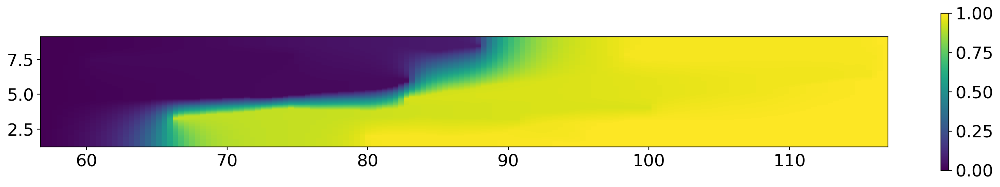

In [ ]:
plt.figure(figsize=(20, 3), dpi=200)
plt.imshow(head.get_data()[0, :, :], extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=1)
plt.colorbar()  

In [ ]:
budg = flopy.utils.mflistfile.MfListBudget(f"{workspace}/{name}.lst", budgetkey="VOLUME BUDGET FOR ENTIRE MODEL")
incr, tot = budg.get_budget()

flow = (tot.TOTAL_IN[0] + tot.TOTAL_OUT[0])/2
flow

0.00016354999388568103

In [ ]:
def get_nodes(locs):

    nodes = []
    for k, i, j in locs:
        nodes.append(k * (x_max - x_min) * (y_max - y_min) + i * (x_max - x_min) + j)
    return nodes

# locs = [(i, 0, j) for i in range(nz) for j in range(nx)]
locs = [(0, i, x_max - x_min - 1) for i in range(15, y_max - y_min - 15)]
nodes = get_nodes(locs)

In [ ]:
mpnamf = f"{name}_mp_forward"
mpexe = "../../../prog/modfow/exe/win64/mp7.exe"
# create basic forward tracking modpath simulation
mp = flopy.modpath.Modpath7.create_mp7(
    modelname=mpnamf,
    trackdir="forward",
    flowmodel=gwf,
    model_ws=workspace,
    rowcelldivisions=1,
    columncelldivisions=1,
    layercelldivisions=1,
    nodes = nodes,
    exe_name=mpexe,
)

# write modpath datasets
mp.write_input()

# run modpath
mp.run_model()

FloPy is using the following executable to run the model: ..\..\..\..\prog\modfow\exe\win64\mp7.exe

MODPATH Version 7.2.001   
Program compiled Feb 19 2024 14:23:08 with IFORT compiler (ver. 20.21.7)        
 
 
Run particle tracking simulation ...
Processing Time Step     1 Period     1.  Time =  1.00000E+00  Steady-state flow                                                    

Particle Summary:
         0 particles are pending release.
         0 particles remain active.
         0 particles terminated at boundary faces.
         0 particles terminated at weak sink cells.
         0 particles terminated at weak source cells.
        95 particles terminated at strong source/sink cells.
         0 particles terminated in cells with a specified zone number.
         0 particles were stranded in inactive or dry cells.
         0 particles were unreleased.
         0 particles have an unknown status.
 
Normal termination.                                                        


(True, [])

In [ ]:
import os
fpth = os.path.join(workspace, f"{mpnamf}.mppth")
p = flopy.utils.PathlineFile(fpth)

fpth = os.path.join(workspace, f"{mpnamf}.mpend")
e = flopy.utils.EndpointFile(fpth)

In [ ]:
new_bhs = []
for bh in bhs:
    new_depth = bh[1] - np.interp(bh[0]-1, xg, bot)

    new_bhs.append((bh[0], new_depth, bh[2]))

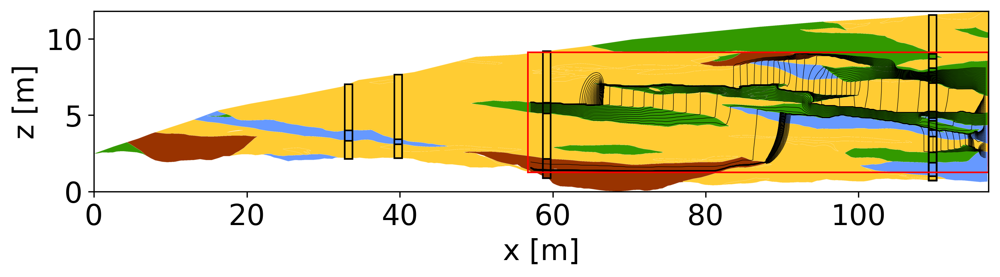

In [ ]:
# plot the head
plt.figure(figsize=(10, 4), dpi=300)
plt.imshow(arr_plot_ref, extent=[ox, x1, oz, z1-0.7], alpha=1, aspect=2)
for pathline in p.get_alldata():
    plt.plot(pathline["x"] + x_min_coord, pathline["y"] + y_min_coord, c="k", linewidth=.3)

plt.plot([x_min_coord, x_max_coord], [y_min_coord, y_min_coord], c="r", linewidth=1)
plt.plot([x_min_coord, x_max_coord], [y_max_coord, y_max_coord], c="r", linewidth=1)
plt.plot([x_min_coord, x_min_coord], [y_min_coord, y_max_coord], c="r", linewidth=1)
plt.plot([x_max_coord, x_max_coord], [y_min_coord, y_max_coord], c="r", linewidth=1)

plt.xlabel("x [m]")
plt.ylabel("z [m]")

plot_bh(new_bhs, colors=colors, ax=plt.gca())   

# plt.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_ref_flow.png", bbox_inches='tight')

In [259]:
e.get_alldata().time/86400

array([ 33.60040799,  29.34862847,  29.25639757,  26.92238137,
        25.9135272 ,  25.31597512,  22.86151331,  22.12650318,
        21.14148872,  29.22390914,  28.66153646,  29.00579282,
        40.02598669,  26.4487934 ,  26.12866609,  25.64426215,
        23.86838108,  22.61562789,  19.40564236,  17.22663918,
        16.61797743,  16.16150174,  17.70090856,  56.84956019,
        68.43306134,  76.40352431,  75.16673032,  97.91180556,
       914.08703704, 873.5062963 , 704.55777778, 610.28518519,
       545.36939815, 494.93736111, 453.16902778, 417.12402778,
       384.618125  , 354.916875  , 327.26891204, 301.1980787 ,
       276.21490741, 252.09435185, 227.06740741, 200.13766204,
       173.74104167, 146.45314815, 108.13247685,  41.91246817,
         1.75197754,   1.67446181,   1.61537182,   1.54982476,
         1.502855  ,   1.60459238,   1.75998879,   1.974645  ,
         2.22207357,   2.83784234,   3.154949  ,   9.78204355,
        17.32271701,  18.59524016,  17.47082465,  16.90

In [260]:
e.get_alldata()["x"]

array([0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39], dtype=float32)

### EROS flow

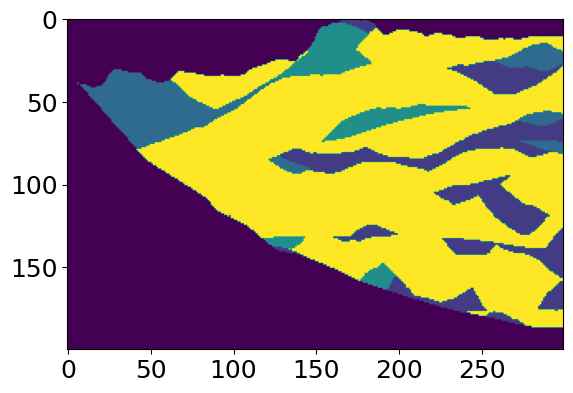

In [278]:
plt.imshow(sims[0])

In [279]:
# EROSim simulations
simu = sims[0]
eros_k = np.ones(new_ref.shape) * 1e-3

for k,v in dic_facies_k.items():
    eros_k[simu == k] = v

npf = flopy.mf6.modflow.mfgwfnpf.ModflowGwfnpf(
    gwf, pname="npf", icelltype=0, k=np.flipud(eros_k[y_min:y_max, x_min:x_max]), save_flows=True
)

npf.write()

sim.run_simulation()

FloPy is using the following executable to run the model: ..\..\..\..\prog\modfow\exe\win64\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.4.4 02/13/2024

   MODFLOW 6 compiled Feb 19 2024 14:20:00 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to further analysis and review. No warranty, expressed or 
implied, is made by the USGS or the U.S. Government as to the 
functionality of the software and related material nor shall the 
fact of release constitute any such warranty. Furthermore, the 
software is released on condition that neither the USGS nor th

(True, [])

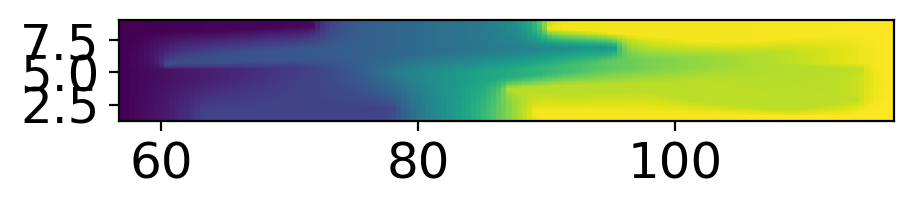

In [280]:
# read the head file
headfile = f"{workspace}/{name}.hds"
head = flopy.utils.HeadFile(headfile)
head.get_data().shape

# plot the head
plt.figure(figsize=(5, 5), dpi=200)
plt.imshow(head.get_data()[0, :, :], extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=1)

In [281]:
mpnamf = f"{name}_mp_forward"
mpexe = "../../../prog/modfow/exe/win64/mp7.exe"
# create basic forward tracking modpath simulation
mp = flopy.modpath.Modpath7.create_mp7(
    modelname=mpnamf,
    trackdir="forward",
    flowmodel=gwf,
    model_ws=workspace,
    rowcelldivisions=1,
    columncelldivisions=1,
    layercelldivisions=1,
    nodes = nodes,
    exe_name=mpexe,
)

# write modpath datasets
mp.write_input()

# run modpath
mp.run_model()

FloPy is using the following executable to run the model: ..\..\..\..\prog\modfow\exe\win64\mp7.exe

MODPATH Version 7.2.001   
Program compiled Feb 19 2024 14:23:08 with IFORT compiler (ver. 20.21.7)        
 
 
Run particle tracking simulation ...
Processing Time Step     1 Period     1.  Time =  1.00000E+00  Steady-state flow                                                    

Particle Summary:
         0 particles are pending release.
         0 particles remain active.
         0 particles terminated at boundary faces.
         0 particles terminated at weak sink cells.
         0 particles terminated at weak source cells.
        95 particles terminated at strong source/sink cells.
         0 particles terminated in cells with a specified zone number.
         0 particles were stranded in inactive or dry cells.
         0 particles were unreleased.
         0 particles have an unknown status.
 
Normal termination.                                                        


(True, [])

In [282]:
fpth = os.path.join(workspace, f"{mpnamf}.mppth")
p2 = flopy.utils.PathlineFile(fpth)

fpth = os.path.join(workspace, f"{mpnamf}.mpend")
e2 = flopy.utils.EndpointFile(fpth)

In [283]:
np.sort(e2.get_alldata().time/86400)

array([1.44263328e-01, 1.44275501e-01, 1.44301758e-01, 1.44322058e-01,
       1.44336107e-01, 1.44416594e-01, 1.44481970e-01, 1.44598140e-01,
       1.44998463e-01, 1.45802590e-01, 1.57493478e-01, 1.99839184e-01,
       3.13282380e-01, 5.86181315e+00, 6.75354094e+00, 8.15915871e+00,
       1.01394264e+01, 1.33799638e+01, 1.71144256e+01, 1.86593374e+01,
       1.87960055e+01, 1.91199334e+01, 1.95286921e+01, 1.96389366e+01,
       2.03712442e+01, 3.00583825e+01, 3.88226707e+01, 4.32782523e+01,
       4.32835359e+01, 4.38365307e+01, 4.38784954e+01, 4.43569444e+01,
       4.45655295e+01, 4.49758160e+01, 4.54345660e+01, 4.60688310e+01,
       4.63978038e+01, 4.75535822e+01, 4.88044329e+01, 4.95924363e+01,
       5.02517361e+01, 5.37398380e+01, 5.61325174e+01, 5.74904745e+01,
       6.06354456e+01, 6.09977488e+01, 6.45603125e+01, 6.52366782e+01,
       6.94276157e+01, 7.22919850e+01, 7.31484144e+01, 7.69150347e+01,
       7.99626100e+01, 8.07380266e+01, 8.46382697e+01, 8.48171412e+01,
      

In [287]:
budg = flopy.utils.mflistfile.MfListBudget(f"{workspace}/{name}.lst", budgetkey="VOLUME BUDGET FOR ENTIRE MODEL")
incr, tot = budg.get_budget()

flow = (tot.TOTAL_IN[0] + tot.TOTAL_OUT[0])/2
print(flow)

0.0008630550000816584


In [288]:
arr_plot = np.zeros([y_max - y_min, x_max - x_min, 3])
arr_final = sims[0][y_min:y_max, x_min:x_max]

o = 0
for ival in np.unique(arr_final):
    if ival == -99:
        arr_plot[arr_final==-99] = (1, 1, 1)
    else:
        arr_plot[arr_final==ival] = colors[ival][:3]
        o += 1

In [289]:
# default font size
plt.rcParams.update({'font.size': 18})

Text(0, 0.5, 'z [m]')

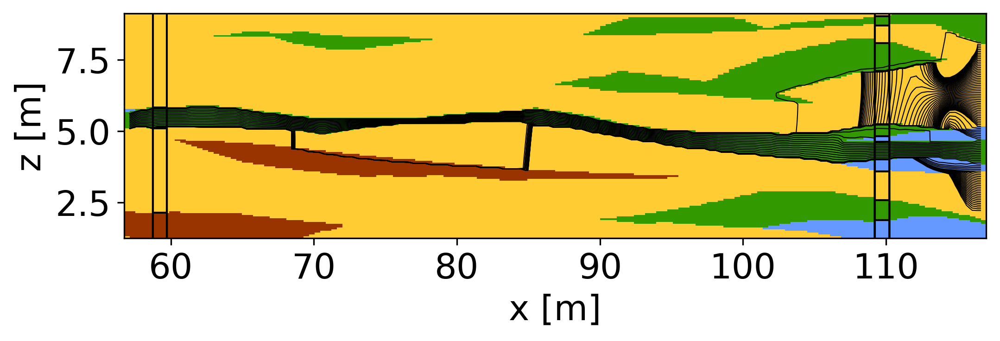

In [290]:
# plot the head

plt.figure(figsize=(8, 4), dpi=300)
# plt.imshow(eros_k[y_min:y_max, x_min:x_max], extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=1)
plt.imshow(arr_plot, extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=2)
for pathline in p2.get_alldata():
    plt.plot(pathline["x"] + x_min_coord, pathline["y"] + y_min_coord, c="k", linewidth=.5)

plot_bh(new_bhs, colors=colors, ax=plt.gca())

plt.xlim(x_min_coord, x_max_coord)
plt.ylim(y_min_coord, y_max_coord)
plt.xlabel("x [m]")
plt.ylabel("z [m]")

# plt.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_eros_flow.png", bbox_inches='tight')

### SIS

In [291]:
# transform borehole data into point data to use it for SIS
x_bh = []
v_bh = []

for bh in bhs:
    for iz in np.arange(bh[1], 0, -sz):
        for ifa in range(len(bh[2])):
            fa = bh[2][ifa]
            if ifa < len(bh[2]) - 1:
                fa2 = bh[2][ifa+1]
            else:
                fa2 = (fa[0], 0)
            if iz < fa[1] and iz > fa2[1]:
                v_bh.append(fa[0])
                x_bh.append((bh[0], iz))
                break

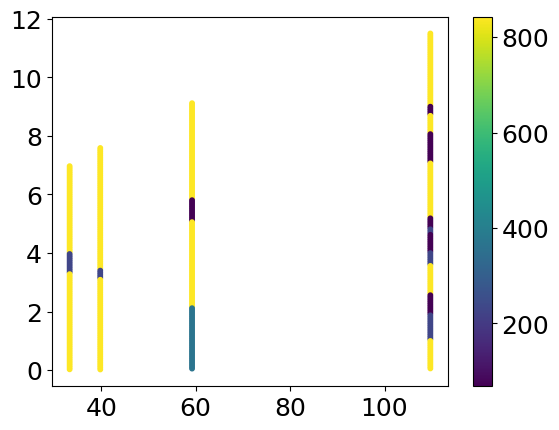

In [292]:
plt.scatter(np.array(x_bh)[:, 0], np.array(x_bh)[:, 1], c=v_bh, cmap="viridis", s=10)
plt.colorbar()

In [293]:
cm_fa1 = geone.covModel.CovModel2D(elem=[("exponential", {"w":0.065, "r":[20, .85]})])
cm_fa2 = geone.covModel.CovModel2D(elem=[("spherical", {"w":0.06, "r":[20, 2]})])
cm_fa3 = geone.covModel.CovModel2D(elem=[("spherical", {"w":0.15, "r":[21, 1]})])
cm_fa4 = geone.covModel.CovModel2D(elem=[("exponential", {"w":0.25, "r":[30, 1.8]})])

cm_sis = [cm_fa1, cm_fa2, cm_fa3, cm_fa4]

# sis
sims_sis = geone.geosclassicinterface.simulateIndicator2D(facies_ids, cm_sis, ((x_max - x_min), (y_max - y_min)), (sx, sz), (x_min*sx, y_min*sz), x=x_bh, v=v_bh, probability=probas, seed=12)


Geos-Classic running... [VERSION 2.0 / BUILD NUMBER 20240322 / OpenMP 15 thread(s)]
Geos-Classic run complete


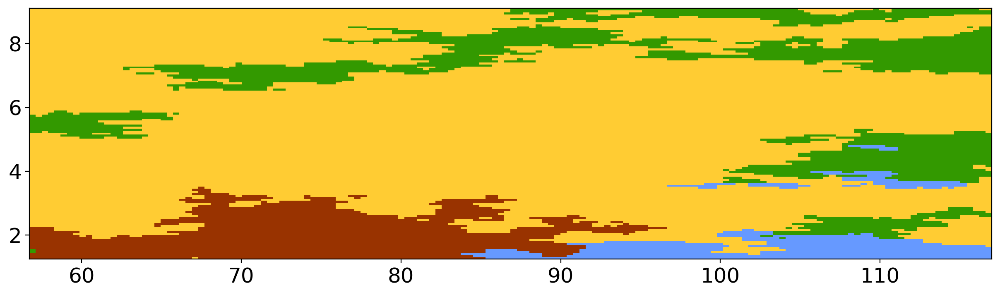

In [294]:
arr_plot = np.zeros([y_max - y_min, x_max - x_min, 3])
arr_final = sims_sis["image"].val[0, 0]

o = 0
for ival in np.unique(arr_final):
    if ival == -99:
        arr_plot[arr_final==-99] = (1, 1, 1)
    else:
        arr_plot[arr_final==ival] = colors[ival][:3]
        o += 1

plt.figure(figsize=(15, 5), dpi=200)
plt.imshow(arr_plot, extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=2)

In [295]:
# SIS simulations
simu = sims_sis["image"].val[0, 0, :, :]
sis_k = np.ones(simu.shape) * 1e-3

for k,v in dic_facies_k.items():
    sis_k[simu == k] = v

npf = flopy.mf6.modflow.mfgwfnpf.ModflowGwfnpf(
    gwf, pname="npf", icelltype=0, k=np.flipud(sis_k), save_flows=True
)

npf.write()

sim.run_simulation(silent=True)

(True, [])

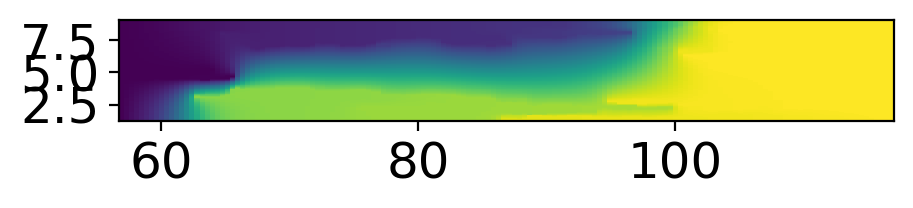

In [296]:
# read the head file
headfile = f"{workspace}/{name}.hds"
head = flopy.utils.HeadFile(headfile)
head.get_data().shape

# plot the head
plt.figure(figsize=(5, 5), dpi=200)
plt.imshow(head.get_data()[0, :, :], extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=1, vmax=1)

In [297]:
mpnamf = f"{name}_mp_forward"
mpexe = "../../../prog/modfow/exe/win64/mp7.exe"
# create basic forward tracking modpath simulation
mp = flopy.modpath.Modpath7.create_mp7(
    modelname=mpnamf,
    trackdir="forward",
    flowmodel=gwf,
    model_ws=workspace,
    rowcelldivisions=1,
    columncelldivisions=1,
    layercelldivisions=1,
    nodes = nodes,
    exe_name=mpexe,
)

# write modpath datasets
mp.write_input()

# run modpath
mp.run_model()

FloPy is using the following executable to run the model: ..\..\..\..\prog\modfow\exe\win64\mp7.exe

MODPATH Version 7.2.001   
Program compiled Feb 19 2024 14:23:08 with IFORT compiler (ver. 20.21.7)        
 
 
Run particle tracking simulation ...
Processing Time Step     1 Period     1.  Time =  1.00000E+00  Steady-state flow                                                    

Particle Summary:
         0 particles are pending release.
         0 particles remain active.
         0 particles terminated at boundary faces.
         0 particles terminated at weak sink cells.
         0 particles terminated at weak source cells.
        95 particles terminated at strong source/sink cells.
         0 particles terminated in cells with a specified zone number.
         0 particles were stranded in inactive or dry cells.
         0 particles were unreleased.
         0 particles have an unknown status.
 
Normal termination.                                                        


(True, [])

In [298]:
fpth = os.path.join(workspace, f"{mpnamf}.mppth")
p3 = flopy.utils.PathlineFile(fpth)

fpth = os.path.join(workspace, f"{mpnamf}.mpend")
e3 = flopy.utils.EndpointFile(fpth)

In [299]:
budg = flopy.utils.mflistfile.MfListBudget(f"{workspace}/{name}.lst", budgetkey="VOLUME BUDGET FOR ENTIRE MODEL")
incr, tot = budg.get_budget()

flow = (tot.TOTAL_IN[0] + tot.TOTAL_OUT[0])/2
print(flow)

9.887250052997842e-05


Text(0, 0.5, 'z [m]')

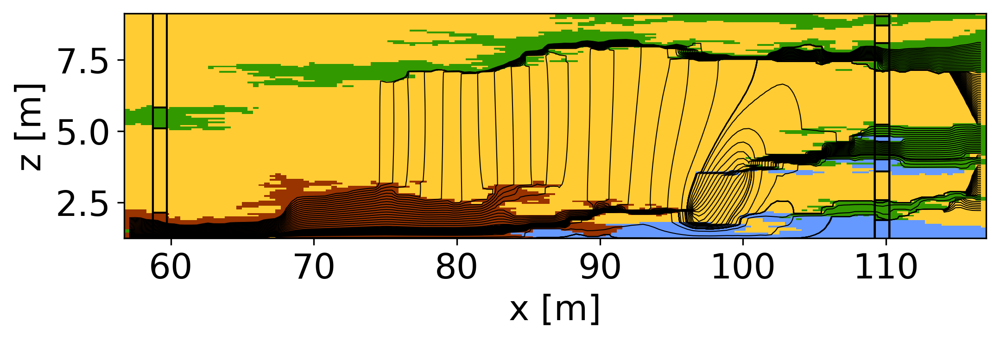

In [300]:
plt.figure(figsize=(8, 4), dpi=300)
# plt.imshow(sis_k, extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=1)
plt.imshow(arr_plot, extent=[x_min_coord, x_max_coord, y_min_coord, y_max_coord], origin="lower", interpolation="none", alpha=1, aspect=2)
for pathline in p3.get_alldata():
    plt.plot(pathline["x"] + x_min_coord, pathline["y"] + y_min_coord, c="k", linewidth=.5)

plot_bh(new_bhs, colors=colors, ax=plt.gca())

plt.xlim(x_min_coord, x_max_coord)
plt.ylim(y_min_coord, y_max_coord)
plt.xlabel("x [m]")
plt.ylabel("z [m]")

# plt.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_sis_flow.png", bbox_inches='tight')

In [301]:
e3.get_alldata()["x"]

array([0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39,
       0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39], dtype=float32)

In [302]:
np.sort(e3.get_alldata().time/86400)

array([   9.11936632,    9.50535229,   10.017011  ,   11.53580367,
         12.09535084,   12.24309462,   12.31282407,   12.35498987,
         12.60824797,   12.86733796,   13.12514902,   14.55231771,
         17.15810041,   17.51167824,   17.70664062,   17.93954861,
         18.07703993,   18.23587674,   18.72733652,   18.84603009,
         19.16978009,   19.70628038,   20.28349392,   20.42312645,
         20.44328704,   20.62045139,   20.71780093,   20.79119792,
         20.92147425,   20.94185041,   21.25425347,   22.71968316,
         23.59759115,   24.37277199,   24.47521123,   30.0317419 ,
         48.67541667,   53.53311343,  191.66142361,  391.44921296,
        455.44324074,  682.25638889,  728.58694444,  912.41907407,
        937.07166667, 1107.44435185, 1109.69694444, 1260.39759259,
       1266.88240741, 1350.63490741, 1382.43509259, 1435.01611111,
       1447.00805556, 1506.05472222, 1564.4737037 , 1632.00314815,
       1706.09018519, 1718.70555556, 1739.64518519, 1793.13370

(array([41.,  6., 12., 10.,  6.,  6.,  8.,  2.,  2.,  2.]),
 array([7.87913250e+05, 5.14677080e+07, 1.02147504e+08, 1.52827296e+08,
        2.03507088e+08, 2.54186880e+08, 3.04866688e+08, 3.55546464e+08,
        4.06226272e+08, 4.56906048e+08, 5.07585856e+08]),
 <BarContainer object of 10 artists>)

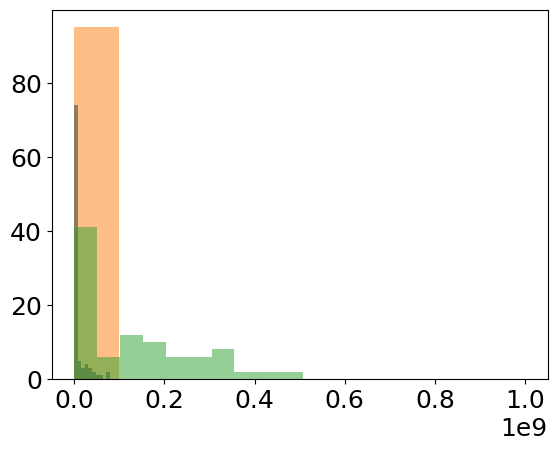

In [303]:
plt.hist(e.get_alldata()["time"])
plt.hist(e2.get_alldata()["time"], alpha=0.5, range=[0, 1e9])
plt.hist(e3.get_alldata()["time"], alpha=0.5)

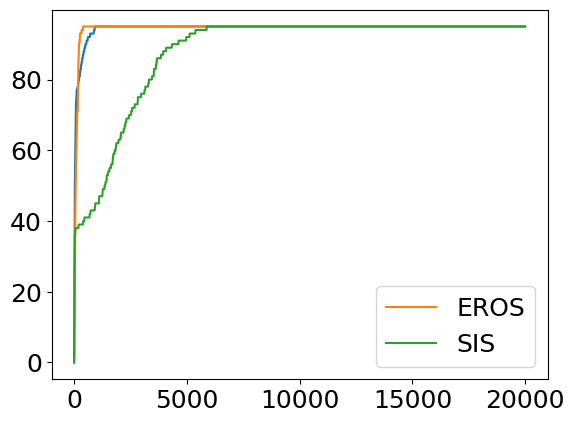

In [304]:
cur=[]
time = range(1, 20000, 10)
for t in time:
    cur.append(((e.get_alldata().time/3600/24).astype(int) < t).sum())

plt.plot(time, cur)

cur3 = []
time = range(1, 20000, 10)
for t in time:
    cur3.append(((e3.get_alldata().time/3600/24).astype(int) < t).sum())

cur2 = []
time = range(1, 20000, 10)
for t in time:
    cur2.append(((e2.get_alldata().time/3600/24).astype(int) < t).sum())

plt.plot(time, cur2, label="EROS")
plt.plot(time, cur3, label="SIS")

plt.legend()


In [167]:
print(e.get_alldata().x)
print(e2.get_alldata().x)
print(e3.get_alldata().x)

[0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39]
[0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39
 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39 0.39]
[0.39 0.39 0.39 0.39 0.39 0.39 0.3

### simulations

In [168]:
nreal = 50

In [169]:
sims_sis = geone.geosclassicinterface.simulateIndicator2D(facies_ids, cm_sis, ((x_max - x_min), (y_max - y_min)), (sx, sz), (x_min*sx, y_min*sz),
                                                           x=x_bh, v=v_bh, probability=probas, seed=12, nreal=nreal)

Geos-Classic running... [VERSION 2.0 / BUILD NUMBER 20240322 / OpenMP 15 thread(s)]
Geos-Classic run complete


In [172]:
# os.mkdir("output2")

In [176]:
def flow_model(k, name="EROS1"):

    model_ws = "workspace"
    modelname = "EROS2D_flow"

    sim = flopy.mf6.MFSimulation.load(sim_ws=model_ws, sim_name=modelname, exe_name="../../../prog/modfow/exe/win64/mf6.exe")
    gwf = sim.get_model()

    npf = flopy.mf6.modflow.mfgwfnpf.ModflowGwfnpf(
        gwf, pname="npf", icelltype=0, k=k, save_flows=True, save_specific_discharge=True,
    )
    
    # write the changes to the npf file
    npf.write()

    # run the model
    sim.run_simulation()

    # # modpath
    # mpnamf = f"{modelname}_mp_forward"
    # mpexe = "../../../prog/modfow/exe/win64/mp7.exe"
    # # create basic forward tracking modpath simulation
    mp = flopy.modpath.Modpath7.create_mp7(
        modelname=mpnamf,
        trackdir="forward",
        flowmodel=gwf,
        model_ws=model_ws,
        rowcelldivisions=1,
        columncelldivisions=1,
        layercelldivisions=1,
        nodes = nodes,
        exe_name=mpexe,
    )

    # # write modpath datasets
    mp.write_input()

    # # run modpath
    mp.run_model()

    # copy lst file to output
    
    # find lst file
    import shutil
    for file in os.listdir("workspace"):
        if file == "EROS_2Dflow.lst":
            shutil.copyfile(f"workspace/{file}", f"output2/{name}.lst")
            break

In [177]:
for ireal in range(nreal):

    simu = sims_sis["image"].val[ireal, 0, :, :]
    sis_k = np.ones(simu.shape) * 1e-3

    for k, v in dic_facies_k.items():
        sis_k[simu == k] = v

    flow_model(np.flipud(sis_k), name=f"SIS_{ireal}")

loading simulation...
  loading simulation name file...
  loading tdis package...
  loading model gwf6...
    loading package dis...
    loading package ic...
    loading package npf...
    loading package chd...
    loading package oc...
  loading solution package eros_2dflow...
FloPy is using the following executable to run the model: ..\..\..\..\prog\modfow\exe\win64\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.4.4 02/13/2024

   MODFLOW 6 compiled Feb 19 2024 14:20:00 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to further analysis and review. N

In [182]:
for ireal in range(nreal):

    simu = all_eros_sims[ireal][0][y_min:y_max, x_min:x_max]
    eros_k = np.ones(simu.shape) * 1e-3

    for k, v in dic_facies_k.items():
        eros_k[simu == k] = v

    flow_model(np.flipud(eros_k), name=f"EROS_{ireal}")

loading simulation...
  loading simulation name file...
  loading tdis package...
  loading model gwf6...
    loading package dis...
    loading package ic...
    loading package npf...
    loading package chd...
    loading package oc...
  loading solution package eros_2dflow...
FloPy is using the following executable to run the model: ..\..\..\..\prog\modfow\exe\win64\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.4.4 02/13/2024

   MODFLOW 6 compiled Feb 19 2024 14:20:00 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to further analysis and review. N

In [183]:
nreal = 50
import os
import flopy

In [327]:
# default font size
plt.rcParams.update({'font.size': 14})

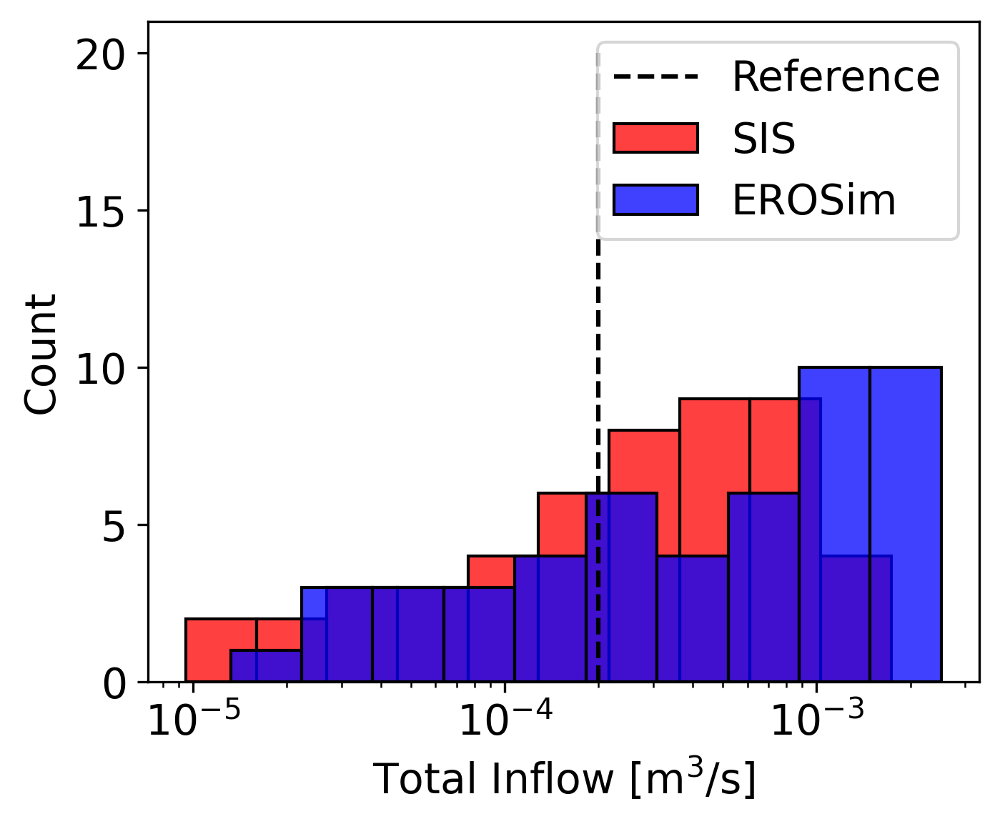

In [333]:
# plot histogram of total flow

def get_flow(name):

    budg = flopy.utils.mflistfile.MfListBudget(f"output2/{name}.lst", budgetkey="VOLUME BUDGET FOR ENTIRE MODEL")
    incr, tot = budg.get_budget()

    return tot.TOTAL_OUT[0]

def get_flows(nreal, prefix):

    flows = []
    for ireal in range(nreal):
        flows.append(get_flow(f"{prefix}_{ireal}"))
    return flows

flows_sis = get_flows(nreal, "SIS")
flows_eros = get_flows(nreal, "EROS")

import seaborn as sns
plt.figure(figsize=(5, 4), dpi=300)
sns.histplot(flows_sis, color="r", label="SIS", bins=10, log_scale=True)
sns.histplot(flows_eros, color="b", label="EROSim", bins=10, log_scale=True)


# plot reference histogram
ref_flow = 0.00020
plt.vlines(ref_flow, 0, 20, color="k", linestyle="--", label="Reference")

plt.legend()

# plot mean
# plt.vlines(np.median(flows_sis), 0, 10, color="r", linestyle="--", label="Mean SIS")
# plt.vlines(np.median(flows_eros), 0, 10, color="b", linestyle="--", label="Mean EROS")

plt.xlabel("Total Inflow [m$^3$/s]")
plt.ylabel("Count")

# plt.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_hist_flow.png", bbox_inches='tight')

In [226]:
def plot_curve(name, **kwargs):
    fpth = os.path.join("output", f"{name}.mpend")
    e = flopy.utils.EndpointFile(fpth)

    cur2 = []
    time = range(1, 5000, 1)
    for t in time:
        cur2.append(((e.get_alldata().time/3600/24).astype(int) < t).sum())

    plt.plot(time, cur2, **kwargs)

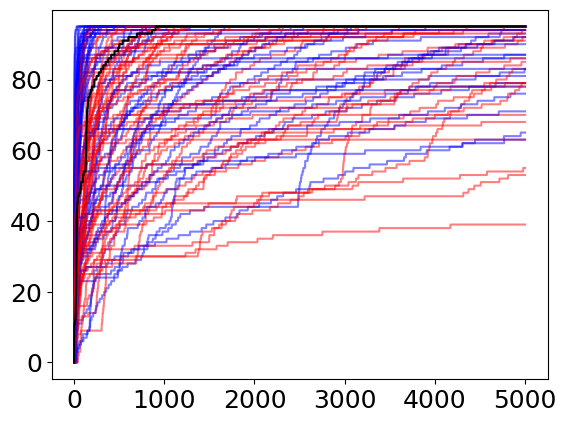

In [227]:
for ireal in range(nreal):
    plot_curve(f"EROS{ireal}", color="blue", alpha=0.5)
    plot_curve(f"SIS_{ireal}", color="red", alpha=0.5)
    
plot_curve(f"ref", color="black", alpha=1)

In [234]:
all_curves_eros = []
for ireal in range(nreal):
    name = f"EROS{ireal}"
    fpth = os.path.join("output", f"{name}.mpend")
    e = flopy.utils.EndpointFile(fpth)

    cur2 = []
    time = range(1, 5000, 1)
    for t in time:
        cur2.append(((e.get_alldata().time/3600/24).astype(int) < t).sum())

    all_curves_eros.append(cur2)

all_curves_sis = []
for ireal in range(nreal):
    name = f"SIS_{ireal}"
    fpth = os.path.join("output", f"{name}.mpend")
    e = flopy.utils.EndpointFile(fpth)

    cur2 = []
    time = range(1, 5000, 1)
    for t in time:
        cur2.append(((e.get_alldata().time/3600/24).astype(int) < t).sum())

    all_curves_sis.append(cur2)

Text(0, 0.5, 'Number of particles')

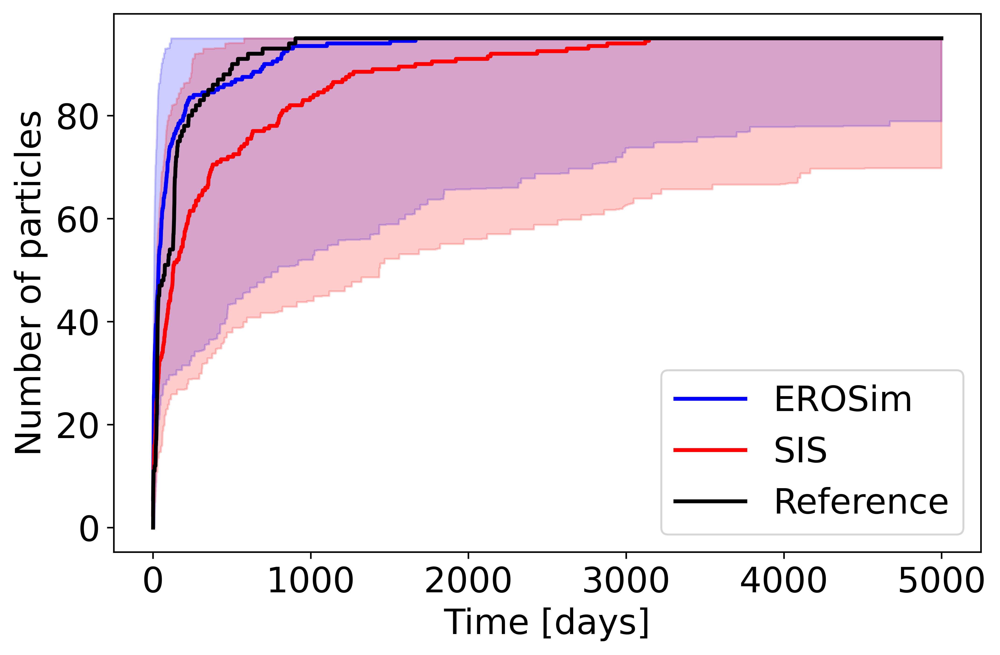

In [235]:
plt.figure(figsize=(8, 5), dpi=600)

# plot 5th and 95th percentile
curve_eros = np.array(all_curves_eros)
curve_sis = np.array(all_curves_sis)

percentile_eros = np.percentile(curve_eros, [10, 90], axis=0)
percentile_sis = np.percentile(curve_sis, [10, 90], axis=0)

plt.fill_between(time, percentile_eros[0], percentile_eros[1], color="blue", alpha=0.2)
plt.fill_between(time, percentile_sis[0], percentile_sis[1], color="red", alpha=0.2)

mean_curve = np.median(all_curves_eros, axis=0)
plt.plot(time, mean_curve, color="blue", linewidth=2, label="EROSim")

mean_curve = np.median(all_curves_sis, axis=0)
plt.plot(time, mean_curve, color="red", linewidth=2, label="SIS")

plot_curve(f"ref", color="black", alpha=1, linewidth=2, label="Reference")

plt.legend()

plt.xlabel("Time [days]")
plt.ylabel("Number of particles")

# plt.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_curves.png", bbox_inches='tight')

In [178]:
# pdf plots

all_particle_time_eros = []
for ireal in range(nreal):
    name = f"EROS{ireal}"
    fpth = os.path.join("output", f"{name}.mpend")
    e = flopy.utils.EndpointFile(fpth)

    all_particle_time_eros.append(e.get_alldata().time/3600/24)

all_particle_time_eros = np.array(all_particle_time_eros).flatten()

all_particle_time_sis = []
for ireal in range(nreal):
    name = f"SIS_{ireal}"
    fpth = os.path.join("output", f"{name}.mpend")
    e = flopy.utils.EndpointFile(fpth)

    all_particle_time_sis.append(e.get_alldata().time/3600/24)

all_particle_time_sis = np.array(all_particle_time_sis).flatten()

In [175]:
import pandas as pd
import seaborn as sns

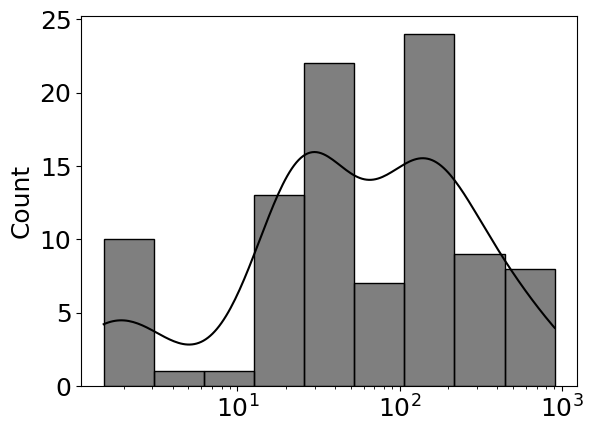

In [319]:
e = flopy.utils.EndpointFile(os.path.join("output", "ref.mpend"))
ref_times = e.get_alldata().time/3600/24
a = sns.histplot(ref_times, color="black", kde=True, label="Reference", log_scale=True)

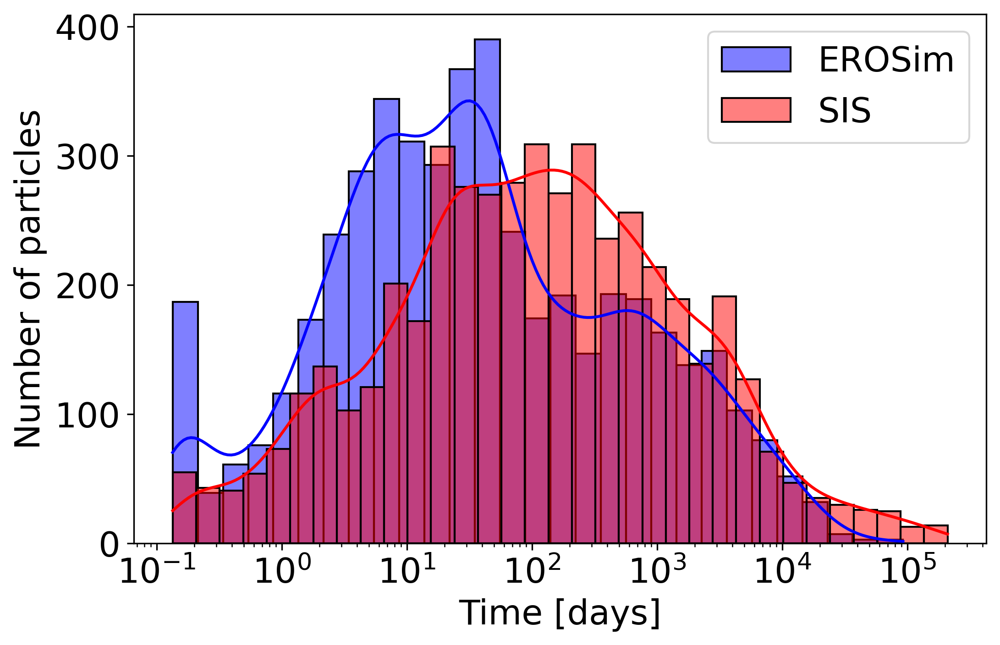

In [179]:
plt.figure(figsize=(8, 5), dpi=300)
sns.histplot(all_particle_time_eros, color="blue", kde=True, label="EROSim", log_scale=True)
sns.histplot(all_particle_time_sis, color="red", kde=True, label="SIS", log_scale=True)

plt.xlabel("Time [days]")
plt.ylabel("Number of particles")
plt.legend()

# plt.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_pdf.png", bbox_inches='tight')

Text(0.5, 0, 'Time [days]')

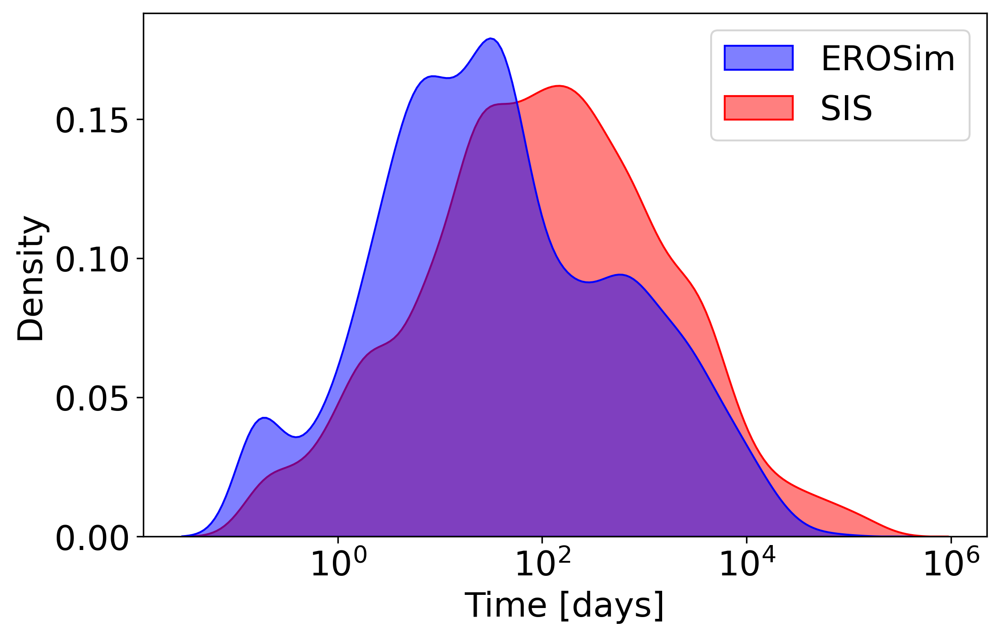

In [181]:


data = np.vstack([all_particle_time_eros, all_particle_time_sis]).T
data = pd.DataFrame(data, columns=["EROSim", "SIS"])

plt.figure(figsize=(8, 5), dpi=300)
sns.kdeplot(data=data, fill=True, alpha=0.5, log_scale=True, clip=(-10, 1e5), palette=["blue", "red"])

# ref
# sns.kdeplot(data=ref_times, fill=True, alpha=0.5, log_scale=True, clip=(-10, 1e5), color="black")

# vertical line at 56 days
# plt.axvline(56, color="black", linestyle="--")

# # vertical line at median travel times for erosim and sis
# plt.axvline(np.median(all_particle_time_eros), color="blue", linestyle="--")
# plt.axvline(np.median(all_particle_time_sis), color="red", linestyle="--")

plt.xlabel("Time [days]")

# plt.savefig("../../../figures/articles/EROS/raw_images/application_Bum_EW_pdf.png", bbox_inches='tight')

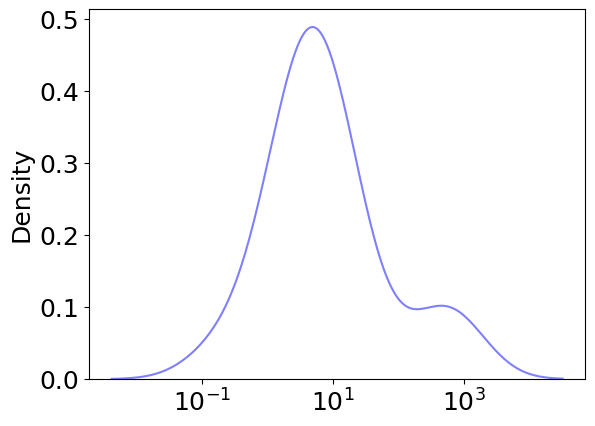

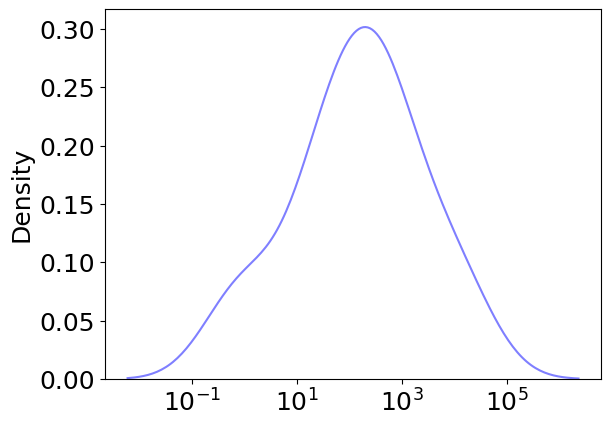

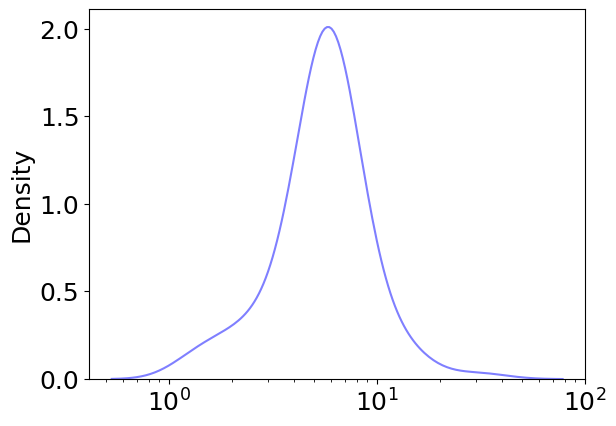

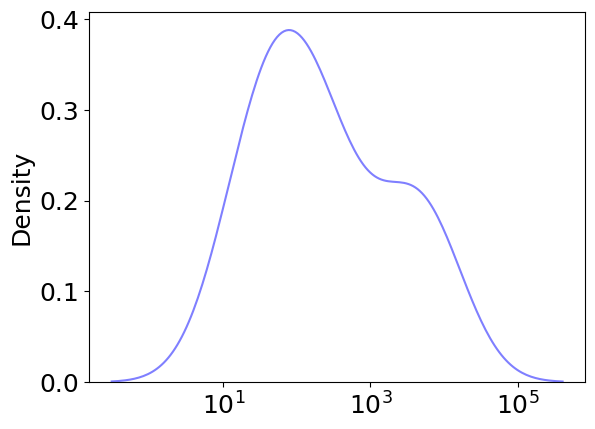

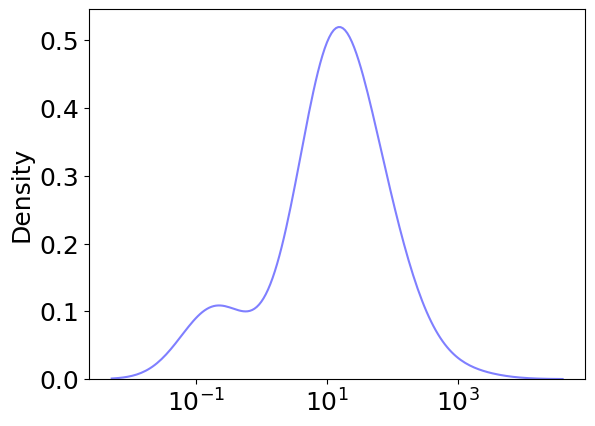

...

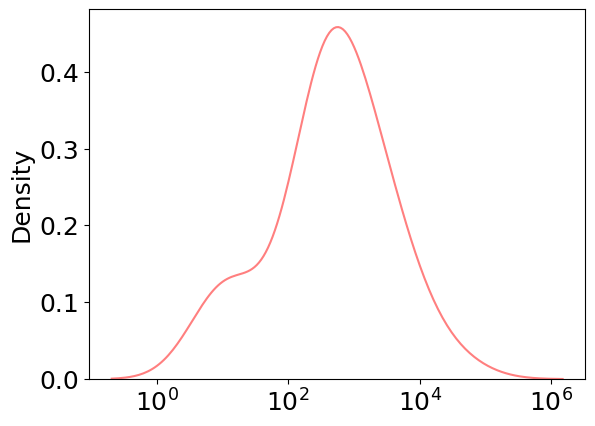

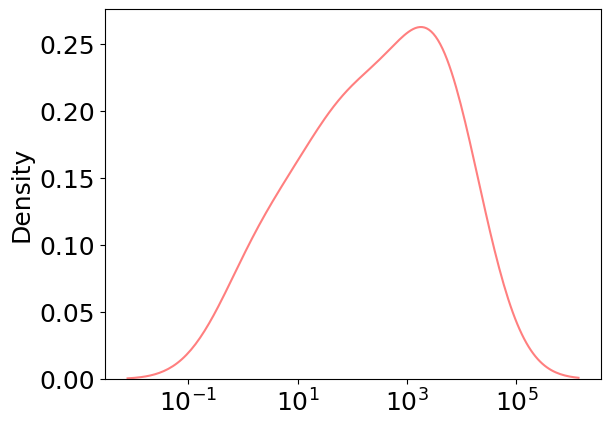

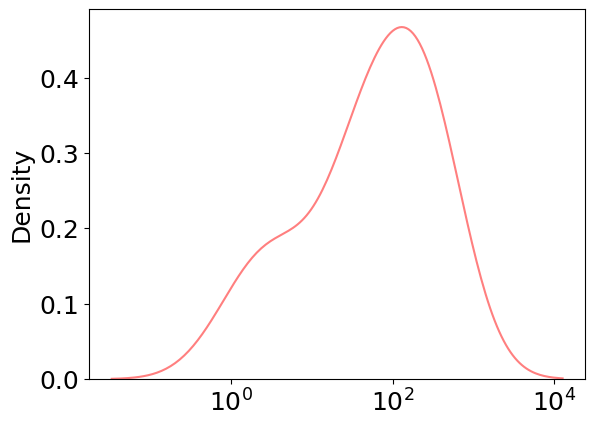

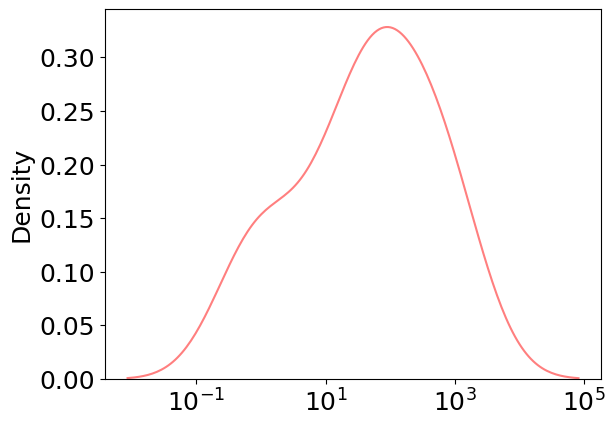

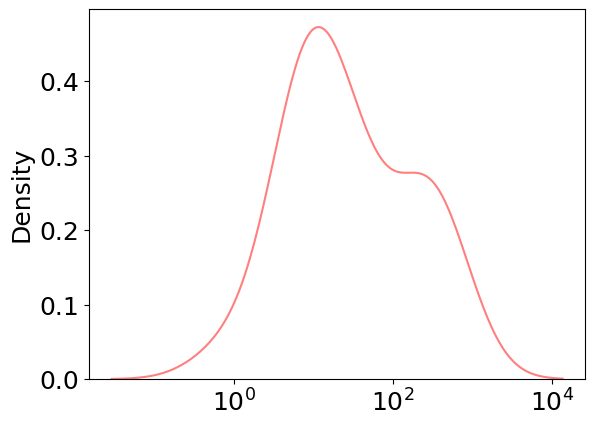

In [296]:
list_x = []
list_y = []

for ireal in range(nreal):
    name = f"EROS{ireal}"
    fpth = os.path.join("output", f"{name}.mpend")
    e = flopy.utils.EndpointFile(fpth)

    data = e.get_alldata().time/3600/24
    x, y = sns.kdeplot(data=data, fill=False, alpha=0.5, bw_adjust=1.5, log_scale=True, clip=(-10, 1e5), color="blue").lines[0].get_data()
    plt.show()
    list_x.append(x)
    list_y.append(y)

all_x_eros = np.array(list_x)
all_y_eros = np.array(list_y)

list_x = []
list_y = []

for ireal in range(nreal):
    name = f"SIS_{ireal}"
    fpth = os.path.join("output", f"{name}.mpend")
    e = flopy.utils.EndpointFile(fpth)

    data = e.get_alldata().time/3600/24
    x, y = sns.kdeplot(data=data, fill=False, alpha=0.5, bw_adjust=1.5, log_scale=True, clip=(-10, 1e5), color="red").lines[0].get_data()
    plt.show()
    list_x.append(x)
    list_y.append(y)

all_x_sis = np.array(list_x)
all_y_sis = np.array(list_y)

(0.0, 1.0)

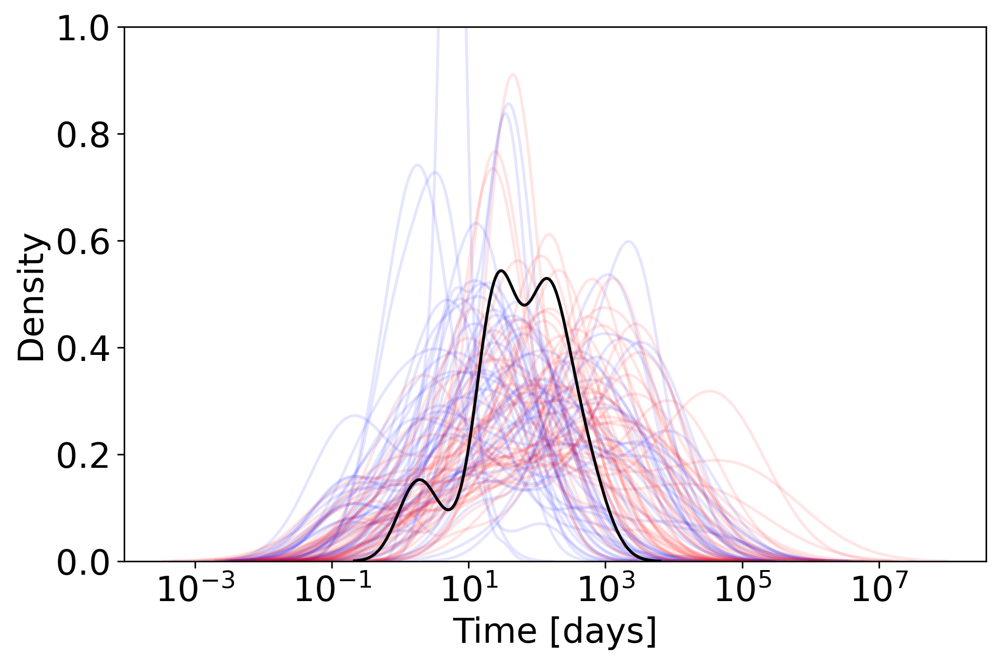

In [297]:
# plot all kde lines
plt.figure(figsize=(8, 5), dpi=300)
for x, y in zip(all_x_eros, all_y_eros):
    plt.plot(x, y, color="blue", alpha=0.1)

for x, y in zip(all_x_sis, all_y_sis):
    plt.plot(x, y, color="red", alpha=0.1)

sns.kdeplot(data=ref_times, fill=False, alpha=1, log_scale=True, clip=(-10, 1e5), color="black", label="Reference")

plt.xlabel("Time [days]")
plt.ylabel("Density")

plt.xscale("log")

plt.ylim(0, 1)

In [298]:
# interpolate the kde lines
from scipy.interpolate import interp1d

range_x = np.logspace(-1, 5, 200)

new_all_y_eros = np.zeros((nreal, 200))
for ireal in range(nreal):
    f = interp1d(all_x_eros[ireal], all_y_eros[ireal], kind="cubic", fill_value=0, bounds_error=False)
    new_all_y_eros[ireal] = f(range_x)

new_all_y_sis = np.zeros((nreal, 200))
for ireal in range(nreal):
    f = interp1d(all_x_sis[ireal], all_y_sis[ireal], kind="cubic", fill_value=0, bounds_error=False)
    new_all_y_sis[ireal] = f(range_x)

(0.0, 1.0)

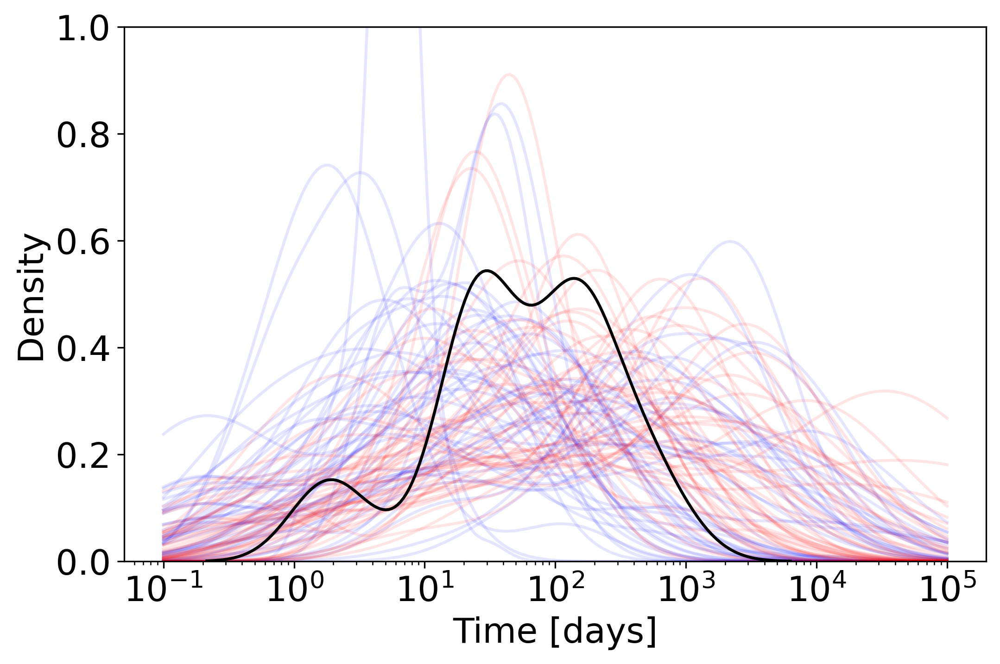

In [320]:
# plot all kde lines
plt.figure(figsize=(8, 5), dpi=300)
for y in new_all_y_eros:
    plt.plot(range_x, y, color="blue", alpha=0.1)

for y in new_all_y_sis:
    plt.plot(range_x, y, color="red", alpha=0.1)

sns.kdeplot(data=ref_times, fill=False, alpha=1, log_scale=True, bw_adjust=1, clip=(-10, 1e5), color="black", label="Reference")

plt.xlabel("Time [days]")
plt.ylabel("Density")

plt.xscale("log")

plt.ylim(0, 1)

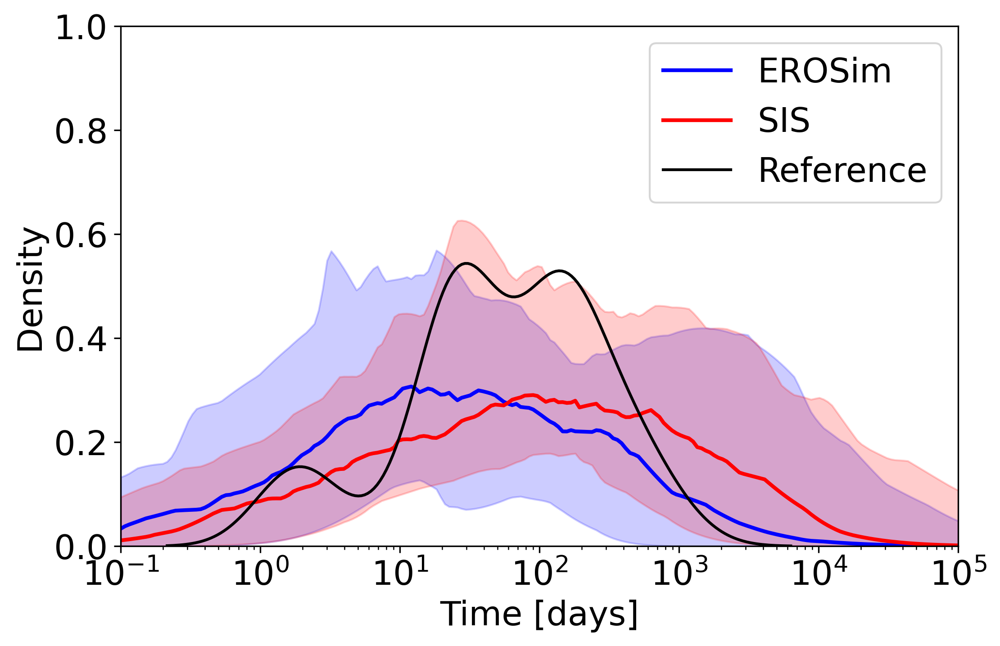

In [321]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# plot median and 5th and 95th percentile (log scale)
median_eros = np.median(new_all_y_eros, axis=0)
percentile_eros = np.percentile(new_all_y_eros, [5, 95], axis=0)

plt.plot(range_x, median_eros, color="blue", linewidth=2, label="EROSim")
plt.fill_between(range_x, percentile_eros[0], percentile_eros[1], color="blue", alpha=0.2)

median_sis = np.median(new_all_y_sis, axis=0)
percentile_sis = np.percentile(new_all_y_sis, [5, 95], axis=0)

plt.plot(range_x, median_sis, color="red", linewidth=2, label="SIS")
plt.fill_between(range_x, percentile_sis[0], percentile_sis[1], color="red", alpha=0.2)

# log scale
plt.xscale("log")
# plt.yscale("log")
plt.xlabel("Time [days]")

plt.xlim(0.1, 1e5)
plt.ylim(0, 1)
# ref
sns.kdeplot(data=ref_times, fill=False, alpha=1, bw_adjust=1, thresh=0.1, log_scale=True, clip=(-1, 1e4), color="black", label="Reference")

plt.legend()

In [365]:
facies_ids

[230, 366, 68, 843]

In [71]:
colors

{510: array([0.8, 0.2, 0.6, 1. ], dtype=float32),
 14: array([0.2, 0.4, 0. , 1. ], dtype=float32),
 744: array([1. , 0.4, 0. , 1. ], dtype=float32),
 230: array([0.4, 0.6, 1. , 1. ], dtype=float32),
 366: array([0.6, 0.2, 0. , 1. ], dtype=float32),
 68: array([0.2, 0.6, 0. , 1. ], dtype=float32),
 843: array([1. , 0.8, 0.2, 1. ], dtype=float32)}

In [89]:
probas

[0.07183233164530575,
 0.08669420336265068,
 0.20846051043252076,
 0.6330129545595228]

In [104]:
np.unique(val, return_counts=True)

(array([-99.,  68., 230., 366., 843.]),
 array([25465,  6631,   706,  1595, 25603], dtype=int64))

In [92]:
val = isim.astype(float).copy()
# val[val == -99] = np.nan

np.unique(val)

array([-99.,  68., 230., 366., 843.])

In [93]:
colors

{510: array([0.8, 0.2, 0.6, 1. ], dtype=float32),
 14: array([0.2, 0.4, 0. , 1. ], dtype=float32),
 744: array([1. , 0.4, 0. , 1. ], dtype=float32),
 230: array([0.4, 0.6, 1. , 1. ], dtype=float32),
 366: array([0.6, 0.2, 0. , 1. ], dtype=float32),
 68: array([0.2, 0.6, 0. , 1. ], dtype=float32),
 843: array([1. , 0.8, 0.2, 1. ], dtype=float32)}

In [119]:
import pickle

In [120]:
with open("cm_params_EW.pkl", "wb") as f:
    pickle.dump(cm_list_by_group, f)

In [57]:
with open("EW_top.pkl", "wb") as f:
    pickle.dump(np.array((xg, top)), f)

with open("EW_bot.pkl", "wb") as f:
    pickle.dump(np.array((xg, bot)), f)